In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [8]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings

def load_thres_product(dir_path, time_range):
    #load time axis
    time_axis = load_time_label(dir_path, time_range = (-200,0), window = 25000, step = 10)
    
    #Load data
    product_data = np.load(dir_path+"cross-product.npy")
    
    #return the data in time_range
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1]) 
    %reset -f in
    
    return product_data[selection_index][:, np.newaxis]


def generate_data(dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step) ##!!!!!! CAREFUL
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)
    moving_thres_crossings = load_thres_product(dir_path, time_range = (time_label.min() - 1e-4, time_label.max()))
    
    
    all_data = np.concatenate((moving_mean, moving_sd, moving_thres_crossings**2), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    plt.figure(figsize=(20,2))
    plt.plot(all_data[:,12])
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=13))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(13,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    #X_train[:,12] = X_train[:,12]*6 #More importance in product of zero-crossings
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    #X_test[:,12] = X_test[:,12]*6 #Put more importance on the product of zero crossings
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > 3)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=3, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks])
    
    else:
        return None
    

def simulation(dir_path, section_size, time_range):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            trigger_time = trigger(current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


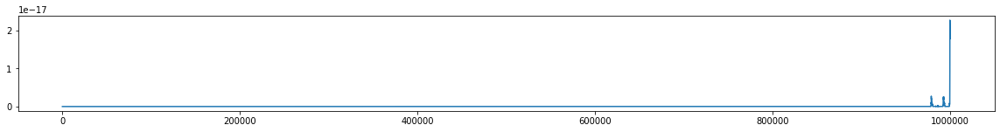

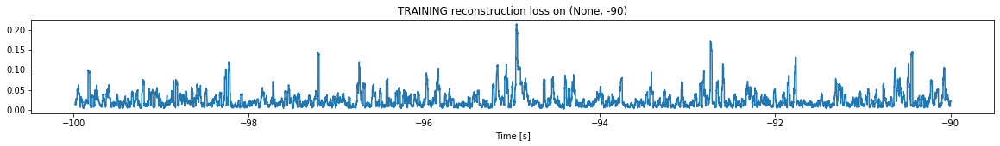

Finished training, median of the log(loss) is:  -1.7393154968086455
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


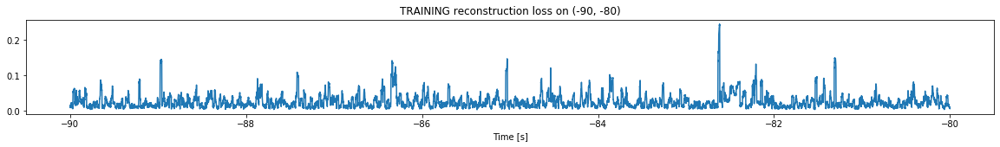

Finished training, median of the log(loss) is:  -1.6765620142859068
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7393154968086455


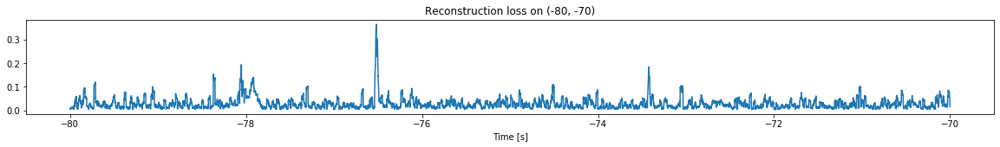

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


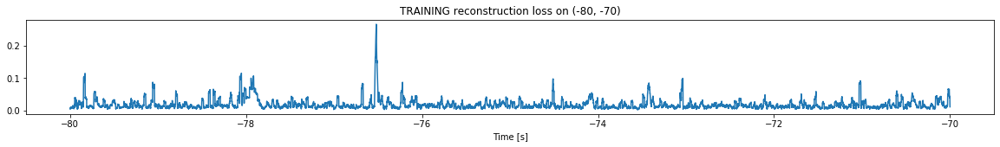

Finished training, median of the log(loss) is:  -1.8443742729756156
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6765620142859068


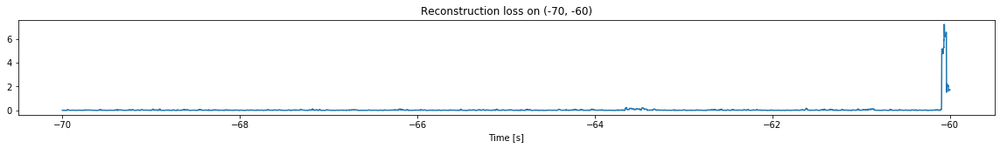

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


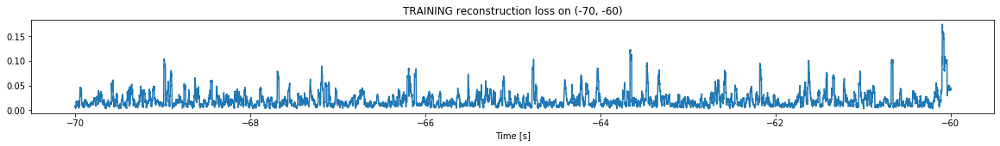

Finished training, median of the log(loss) is:  -1.7899467176935733
Triggering for section:  (-60, -50)
Using this median for triggering: -1.8443742729756156


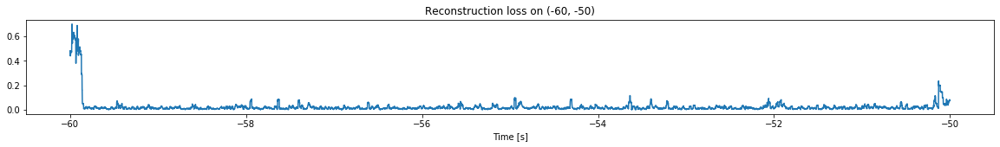

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


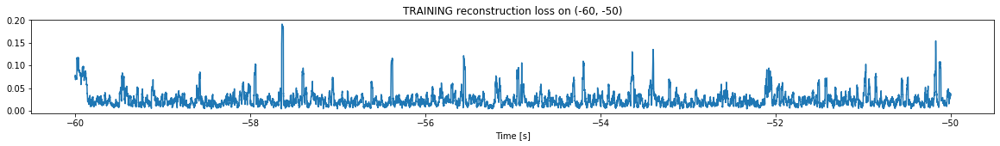

Finished training, median of the log(loss) is:  -1.6967298691602588
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7899467176935733


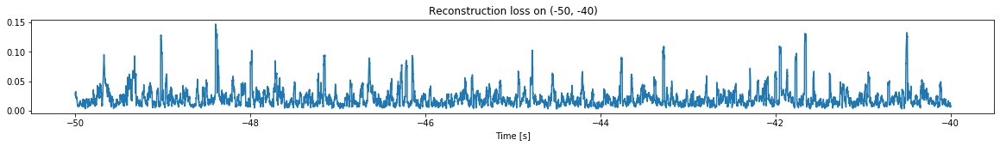

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


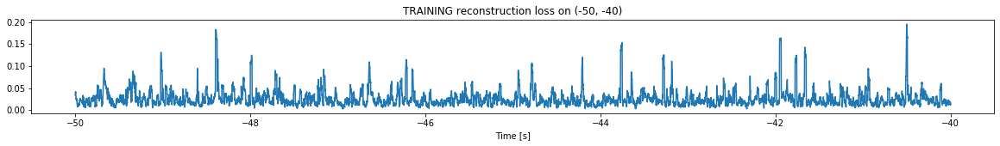

Finished training, median of the log(loss) is:  -1.6706055807779
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6967298691602588


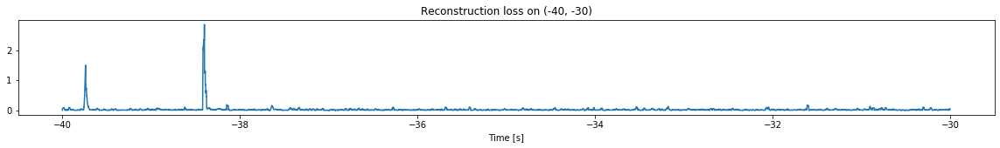

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


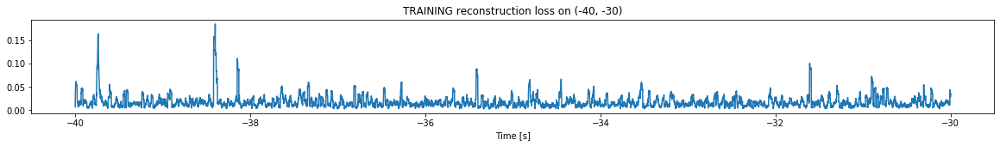

Finished training, median of the log(loss) is:  -1.8350658006876412
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6706055807779


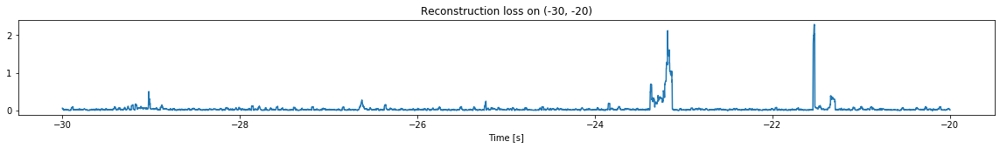

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


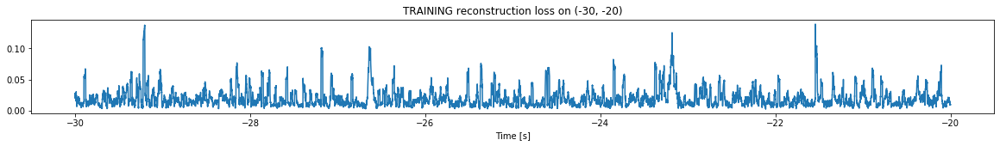

Finished training, median of the log(loss) is:  -1.7834318497116504
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8350658006876412


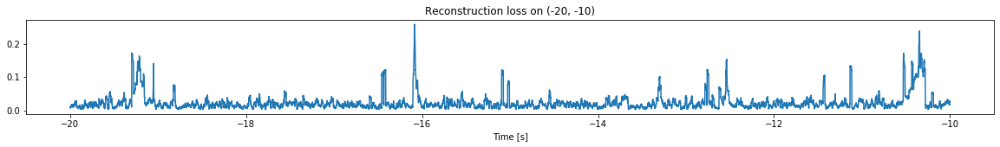

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


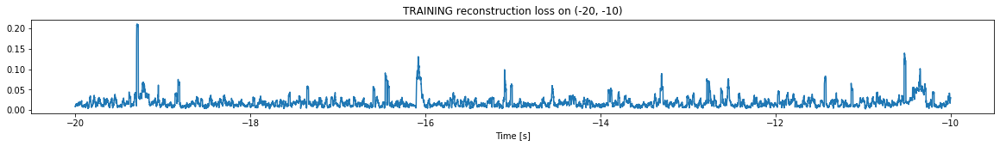

Finished training, median of the log(loss) is:  -1.822048086248757
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7834318497116504


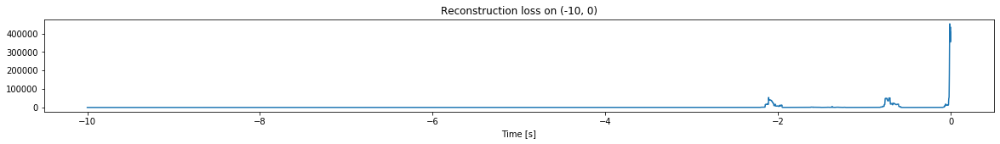

Other trigger time:  [-4.2953    -3.6706998 -2.8834999 -2.1095    -1.3736    -0.7039
 -0.0115   ]
Their log loss values are:  [3.35826923 3.17683577 4.41165204 6.5197588  5.5469617  6.49628791
 7.43969781]


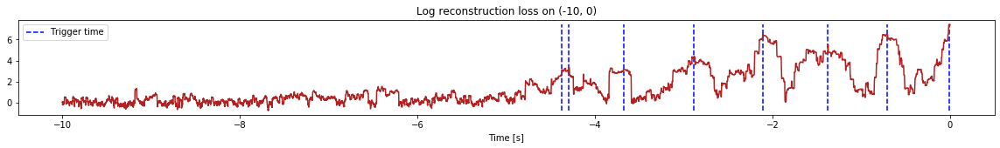

Triggered at:  [-4.2953, -3.6706998, -2.8834999, -2.1095, -1.3736, -0.7039, -0.0115]
<--------
Finished simulation, all the triggered times are:  [-4.2953, -3.6706998, -2.8834999, -2.1095, -1.3736, -0.7039, -0.0115]


In [12]:
simulation("./data/Ramp4/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


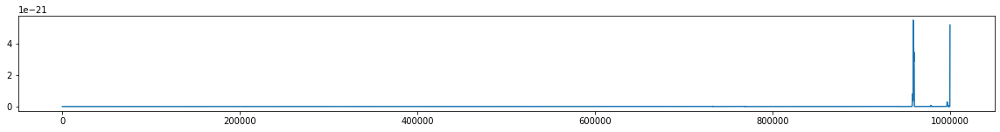

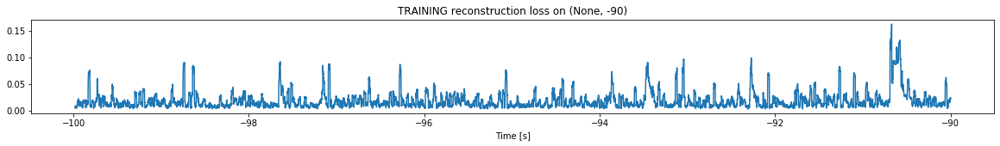

Finished training, median of the log(loss) is:  -1.8653087408828852
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


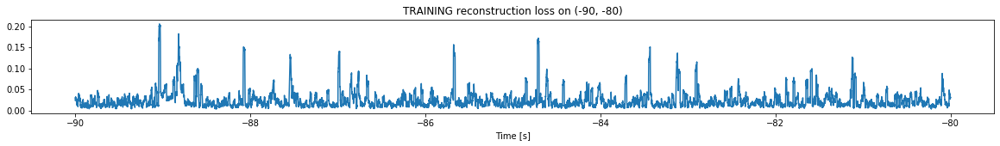

Finished training, median of the log(loss) is:  -1.73835240767637
Triggering for section:  (-80, -70)
Using this median for triggering: -1.8653087408828852


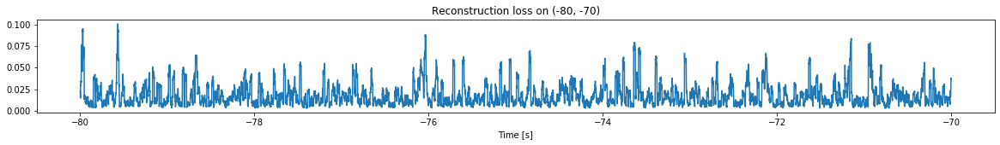

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


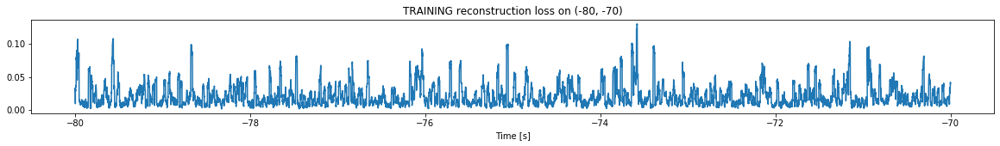

Finished training, median of the log(loss) is:  -1.7903838965652699
Triggering for section:  (-70, -60)
Using this median for triggering: -1.73835240767637


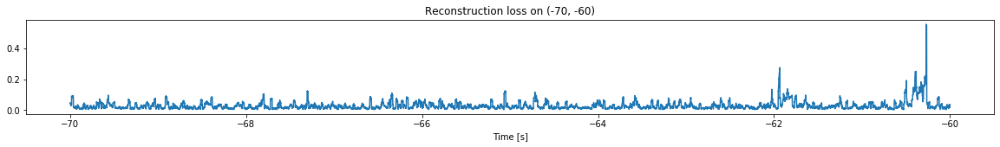

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


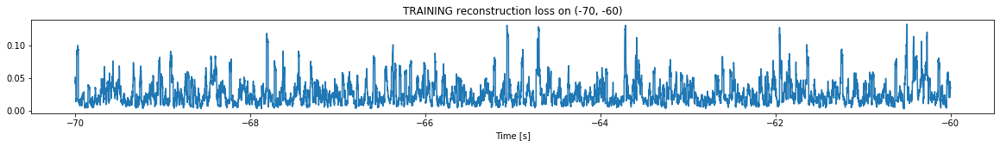

Finished training, median of the log(loss) is:  -1.6714573266181578
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7903838965652699


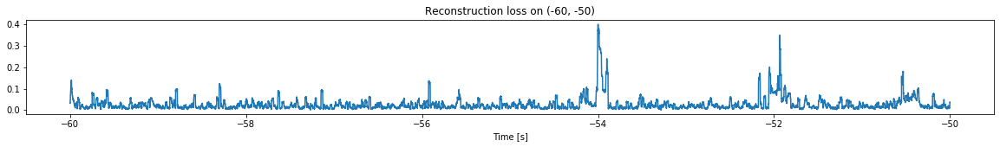

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


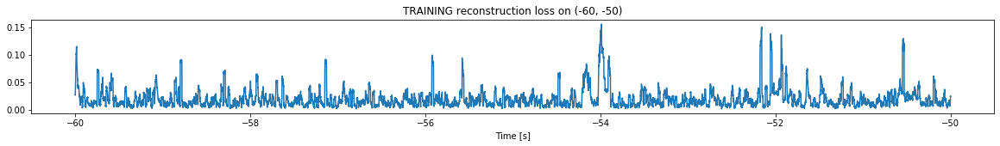

Finished training, median of the log(loss) is:  -1.8208168442070805
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6714573266181578


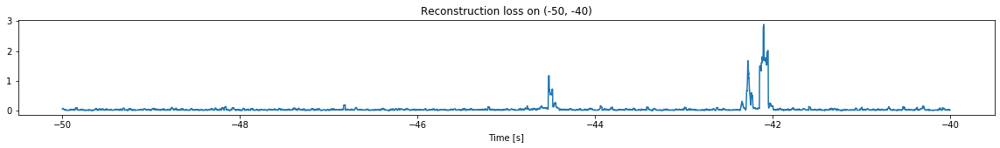

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


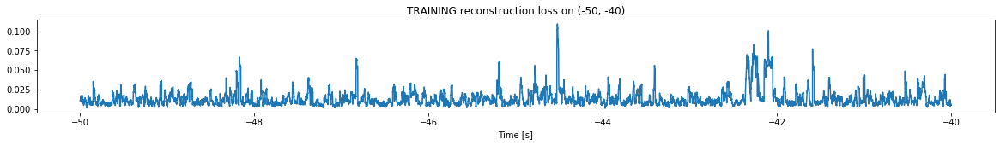

Finished training, median of the log(loss) is:  -1.962509565092696
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8208168442070805


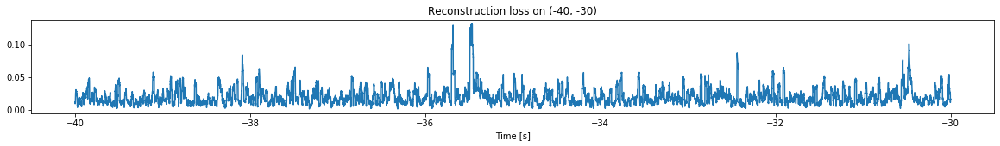

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


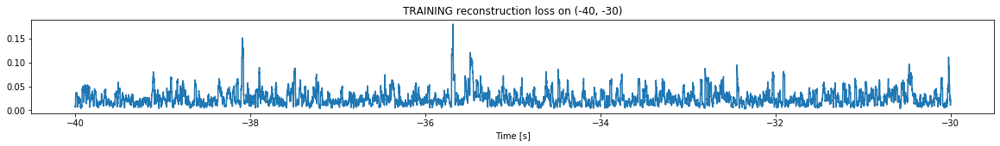

Finished training, median of the log(loss) is:  -1.6684476464177624
Triggering for section:  (-30, -20)
Using this median for triggering: -1.962509565092696


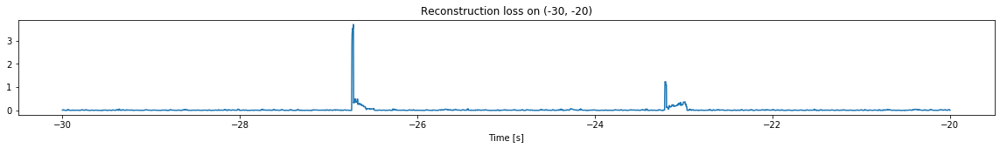

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


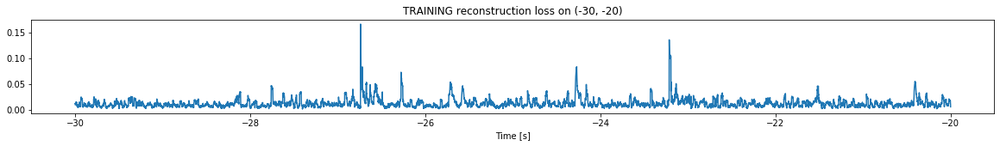

Finished training, median of the log(loss) is:  -1.99524840011714
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6684476464177624


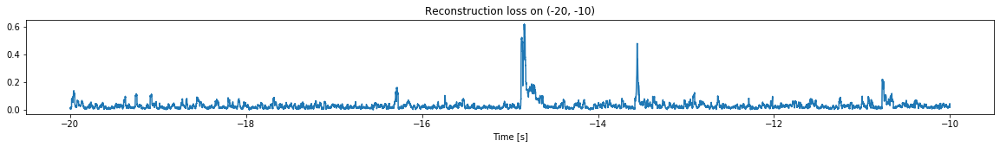

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


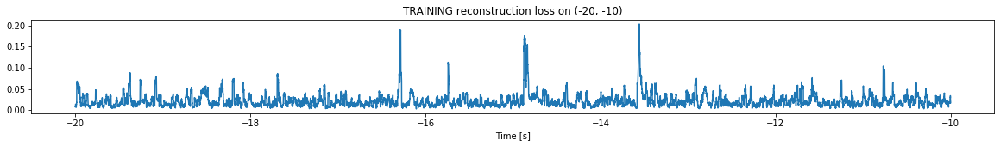

Finished training, median of the log(loss) is:  -1.741533173625799
Triggering for section:  (-10, 0)
Using this median for triggering: -1.99524840011714


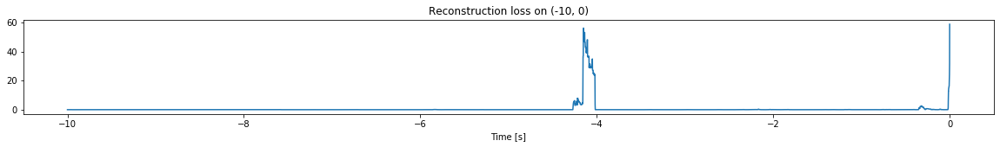

Other trigger time:  [-4.1505 -0.0134]
Their log loss values are:  [3.74526179 3.10478835]


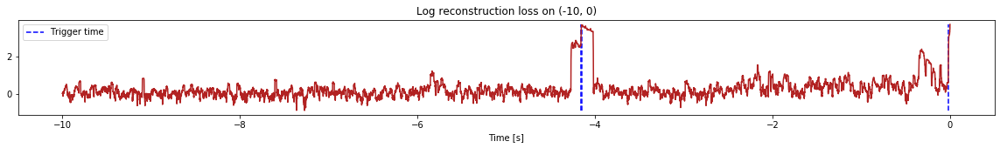

Triggered at:  [-4.1505, -0.0134]
<--------
Finished simulation, all the triggered times are:  [-4.1505, -0.0134]


In [11]:
simulation("./data/Ramp5/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


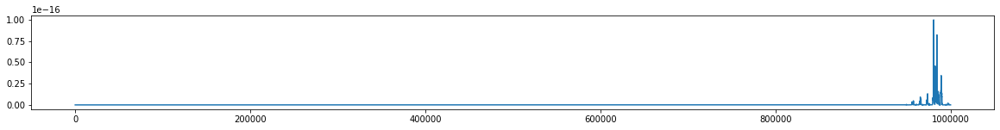

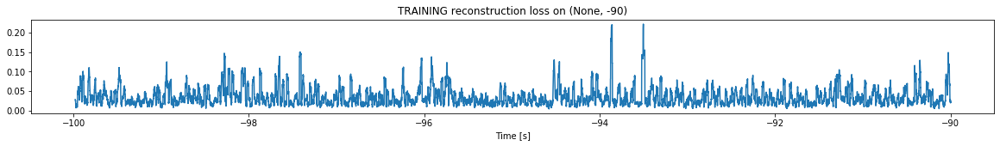

Finished training, median of the log(loss) is:  -1.5401713571410696
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


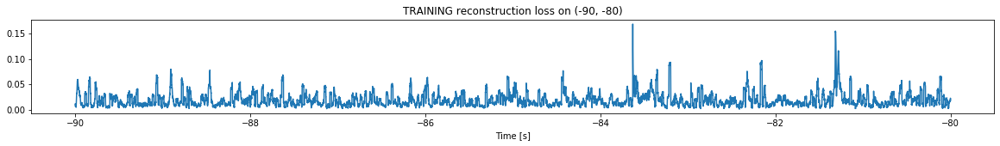

Finished training, median of the log(loss) is:  -1.7970033507653622
Triggering for section:  (-80, -70)
Using this median for triggering: -1.5401713571410696


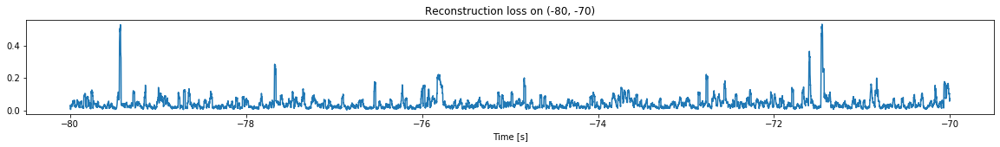

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


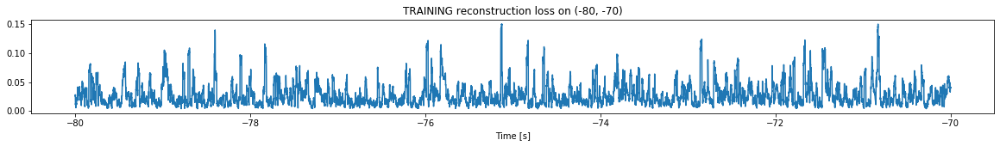

Finished training, median of the log(loss) is:  -1.6500470475842546
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7970033507653622


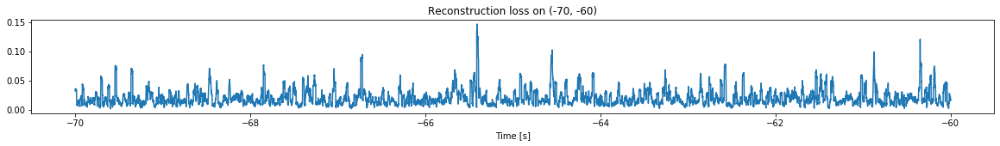

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


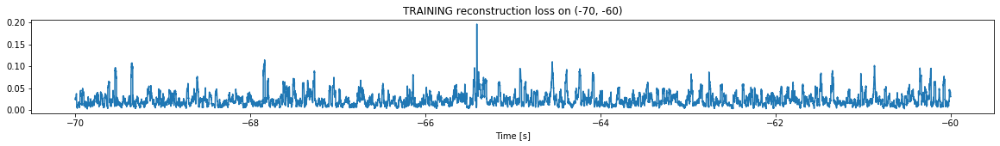

Finished training, median of the log(loss) is:  -1.6993299933630304
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6500470475842546


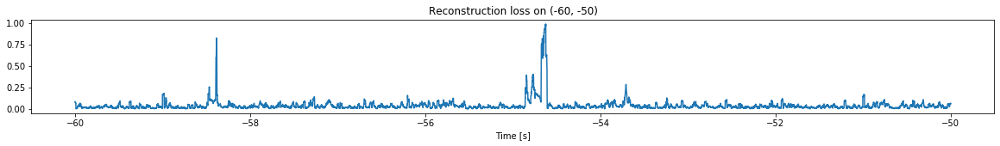

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


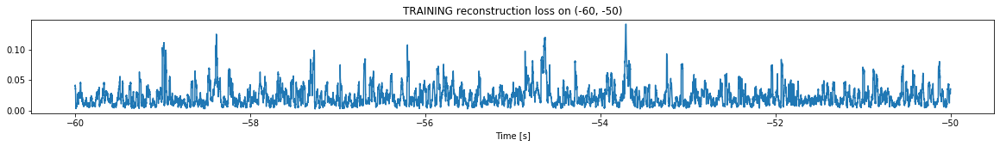

Finished training, median of the log(loss) is:  -1.7189242599009296
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6993299933630304


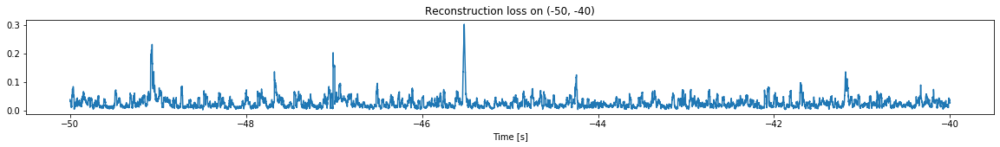

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


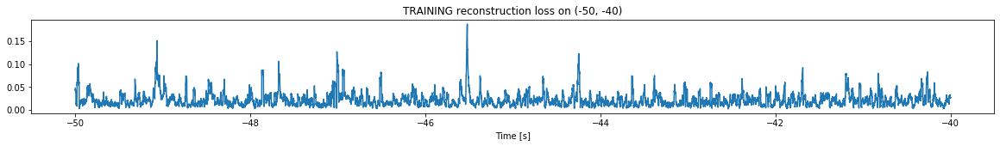

Finished training, median of the log(loss) is:  -1.7312752739979729
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7189242599009296


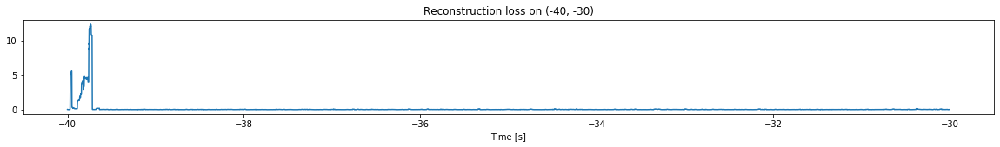

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


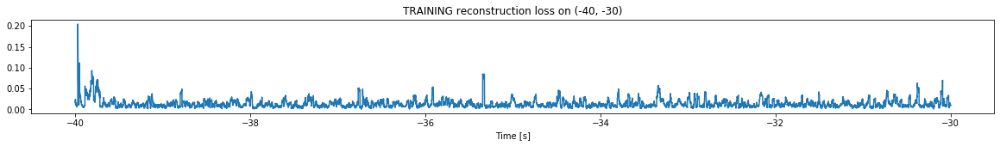

Finished training, median of the log(loss) is:  -1.9459621322877674
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7312752739979729


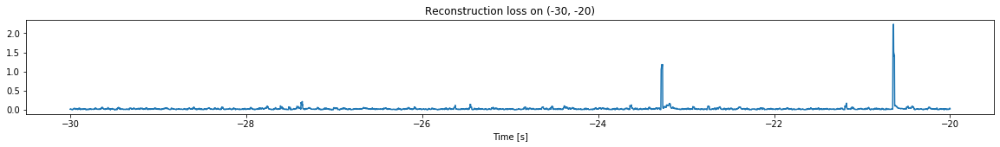

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


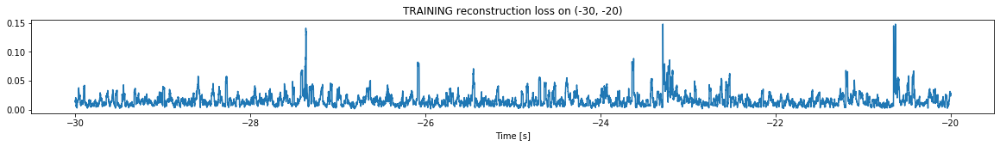

Finished training, median of the log(loss) is:  -1.8475242428417356
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9459621322877674


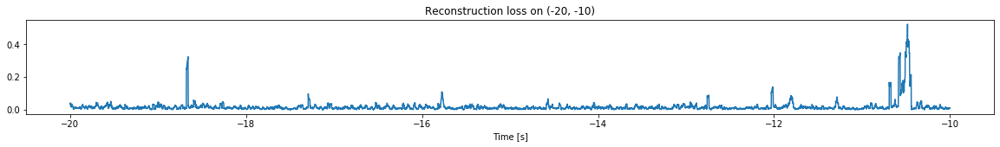

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


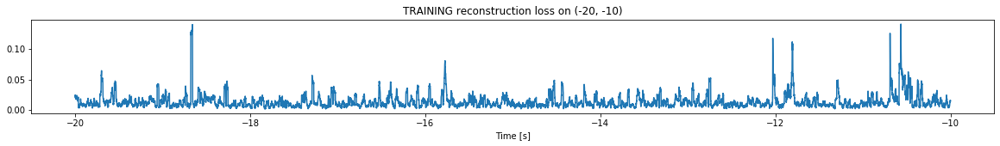

Finished training, median of the log(loss) is:  -1.9888899036825527
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8475242428417356


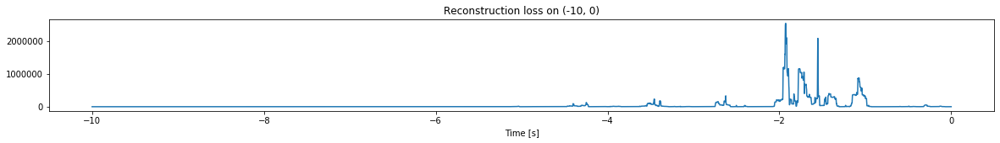

Other trigger time:  [-7.0564    -6.3933997 -5.5516996 -5.0397997 -4.2481    -3.4556
 -2.6244    -1.9283999 -1.0720999 -0.3028   ]
Their log loss values are:  [3.33686851 4.7716761  4.9444984  6.03736829 6.93598963 7.21534148
 7.36771156 8.24990109 7.78752893 6.58335309]


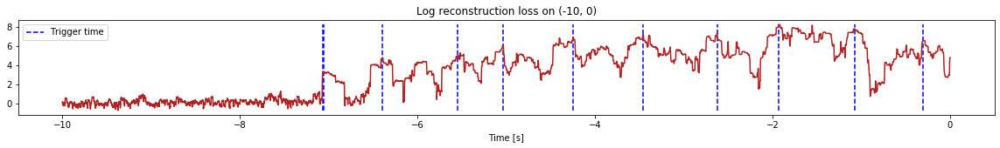

Triggered at:  [-7.0564, -6.3933997, -5.5516996, -5.0397997, -4.2481, -3.4556, -2.6244, -1.9283999, -1.0720999, -0.3028]
<--------
Finished simulation, all the triggered times are:  [-7.0564, -6.3933997, -5.5516996, -5.0397997, -4.2481, -3.4556, -2.6244, -1.9283999, -1.0720999, -0.3028]


In [10]:
simulation("./data/Ramp12d/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1949800, 13)
Flushing input history
Number of sections: 19
Entering sections:  (-190, -180)
-------->
Entering sections:  (-180, -170)
-------->
Training for section:  (None, -180)


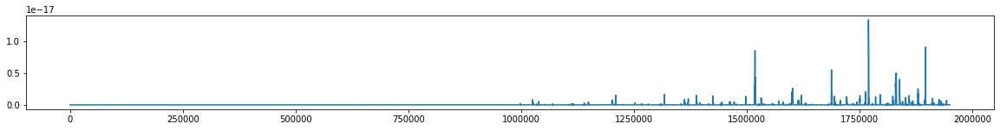

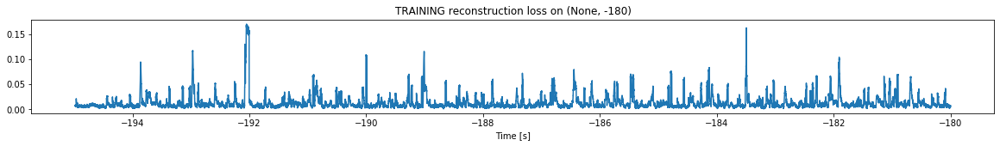

Finished training, median of the log(loss) is:  -2.032708047308656
<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


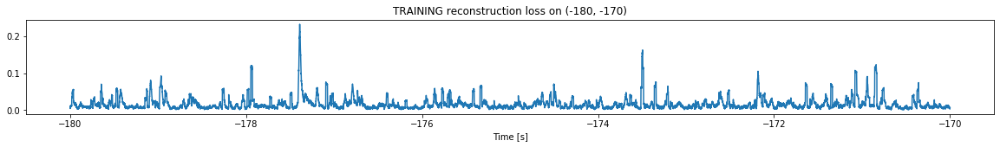

Finished training, median of the log(loss) is:  -1.9200895807627356
Triggering for section:  (-170, -160)
Using this median for triggering: -2.032708047308656


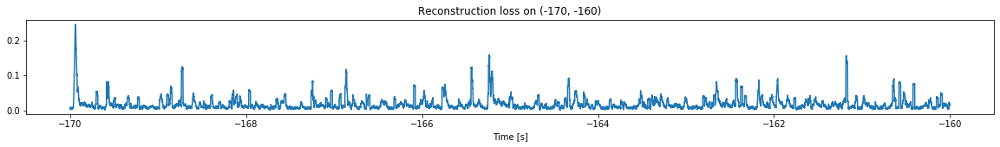

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


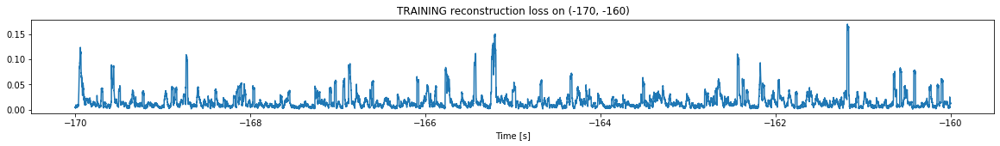

Finished training, median of the log(loss) is:  -1.9355409158409638
Triggering for section:  (-160, -150)
Using this median for triggering: -1.9200895807627356


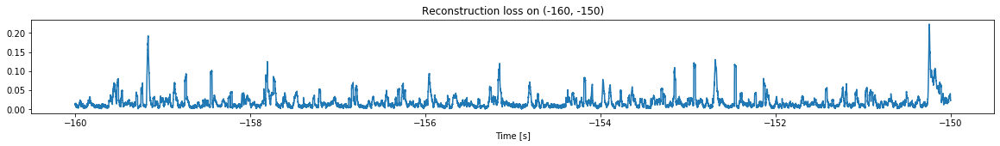

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


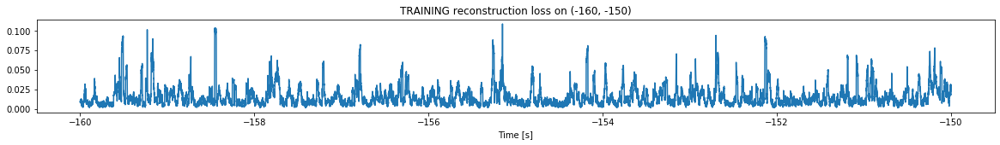

Finished training, median of the log(loss) is:  -1.9320336093639892
Triggering for section:  (-150, -140)
Using this median for triggering: -1.9355409158409638


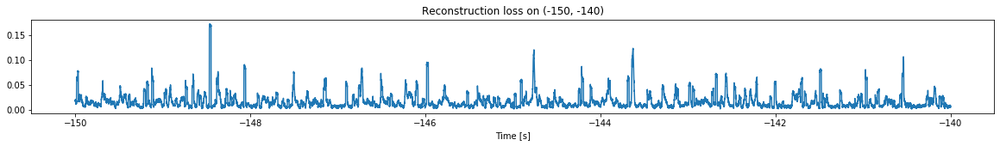

<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


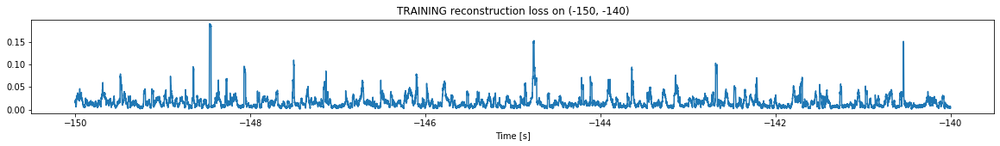

Finished training, median of the log(loss) is:  -1.8901832220926456
Triggering for section:  (-140, -130)
Using this median for triggering: -1.9320336093639892


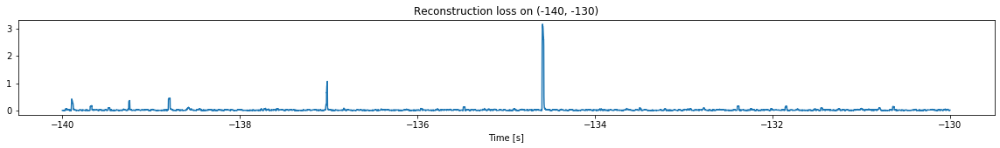

<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


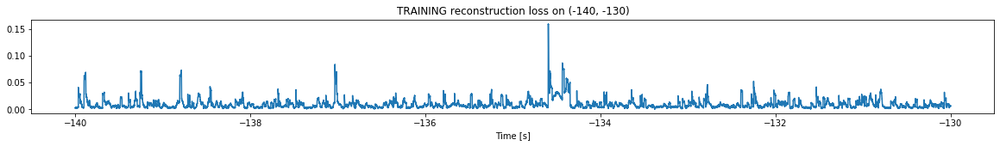

Finished training, median of the log(loss) is:  -2.132707178126397
Triggering for section:  (-130, -120)
Using this median for triggering: -1.8901832220926456


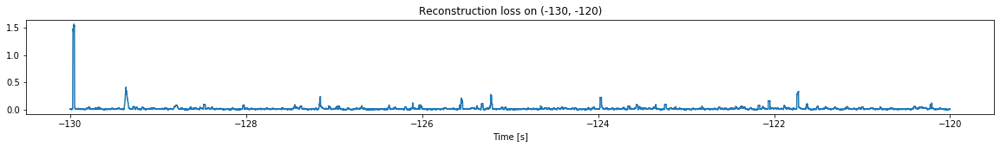

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


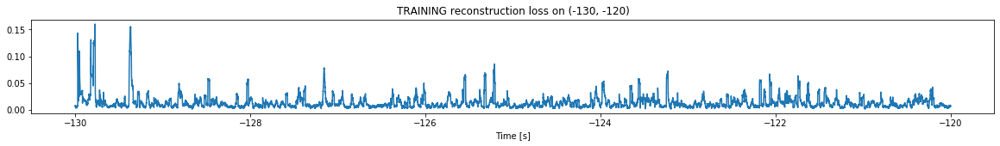

Finished training, median of the log(loss) is:  -2.001535956327297
Triggering for section:  (-120, -110)
Using this median for triggering: -2.132707178126397


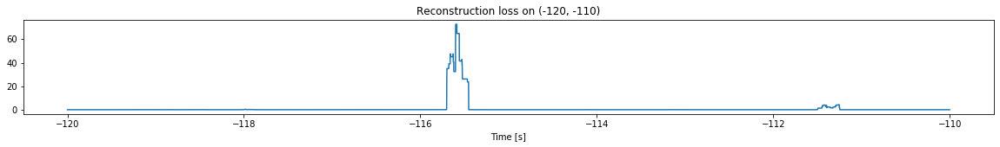

Other trigger time:  [-115.594284]
Their log loss values are:  [3.9946662]


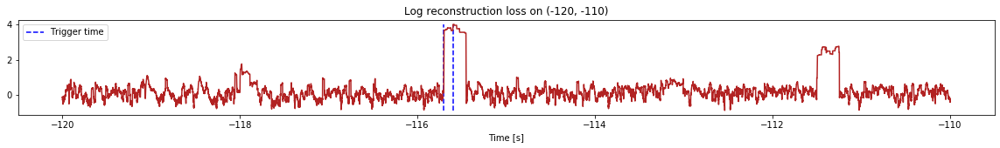

Triggered at:  [-115.594284]
<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


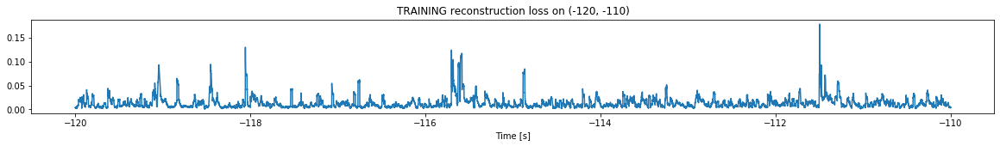

Finished training, median of the log(loss) is:  -1.9875120070230583
Triggering for section:  (-110, -100)
Using this median for triggering: -2.001535956327297


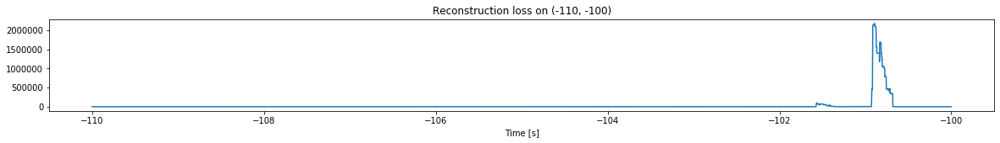

Other trigger time:  [-108.08699  -102.25509  -101.565186 -100.89019  -100.09749 ]
Their log loss values are:  [3.86273138 5.35841878 7.01198369 8.33892453 4.40268926]


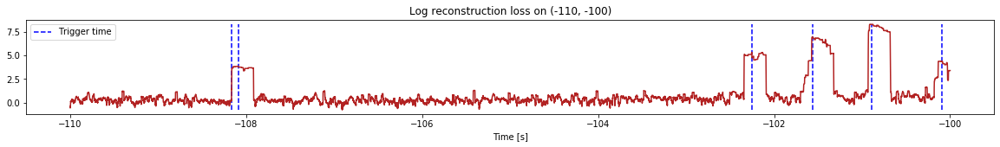

Triggered at:  [-108.08699, -102.25509, -101.565186, -100.89019, -100.09749]
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


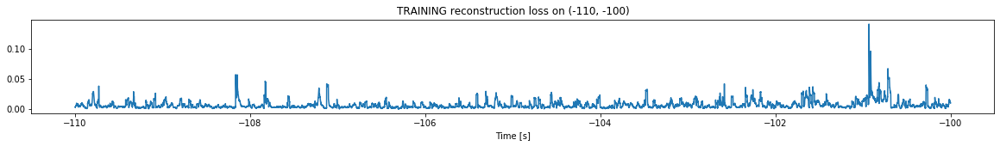

Finished training, median of the log(loss) is:  -2.267367031771825
Triggering for section:  (-100, -90)
Using this median for triggering: -1.9875120070230583


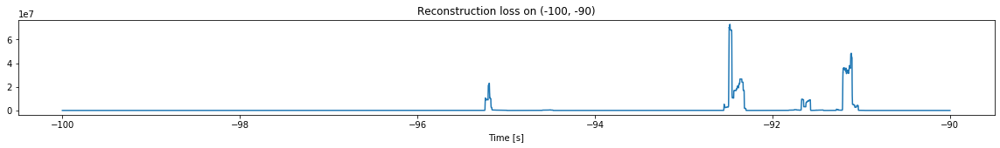

Other trigger time:  [-99.50759  -98.41479  -97.88289  -96.84489  -96.22979  -95.71519
 -95.19009  -94.50299  -93.92869  -93.24849  -92.47909  -91.667984
 -91.11249  -90.178185]
Their log loss values are:  [6.75087778 6.63836733 6.23295381 6.00275158 3.74950822 5.2911181
 9.34869097 7.64693513 5.71710828 6.19267277 9.84972687 8.96808569
 9.67188621 6.6071866 ]


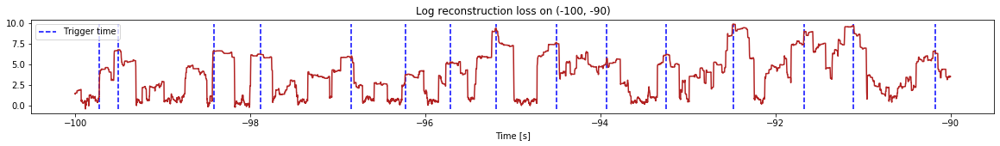

Triggered at:  [-99.50759, -98.41479, -97.88289, -96.84489, -96.22979, -95.71519, -95.19009, -94.50299, -93.92869, -93.24849, -92.47909, -91.667984, -91.11249, -90.178185]
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


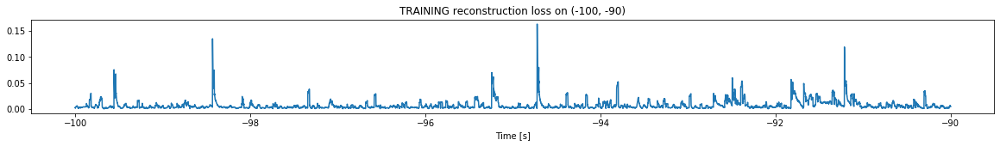

Finished training, median of the log(loss) is:  -2.302334031984406
Triggering for section:  (-90, -80)
Using this median for triggering: -2.267367031771825


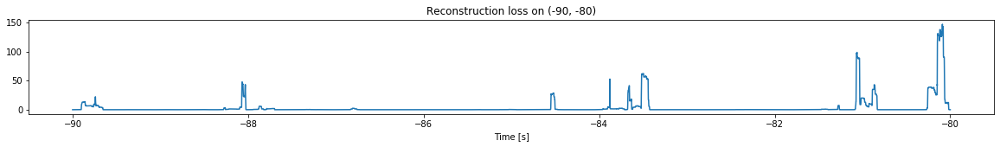

Other trigger time:  [-89.74009  -88.06829  -84.518585 -83.494286 -81.06109  -80.09059 ]
Their log loss values are:  [3.6146829  3.94640268 3.72544885 4.05972984 4.26047371 4.43408457]


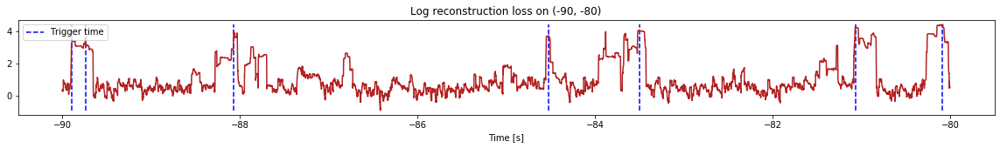

Triggered at:  [-89.74009, -88.06829, -84.518585, -83.494286, -81.06109, -80.09059]
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


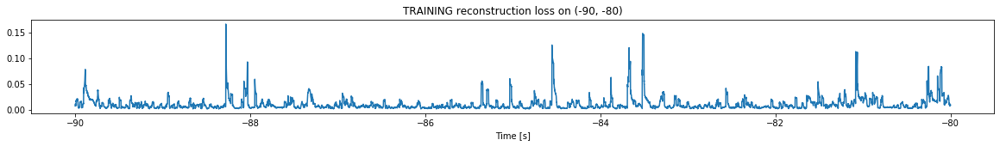

Finished training, median of the log(loss) is:  -2.150699047973789
Triggering for section:  (-80, -70)
Using this median for triggering: -2.302334031984406


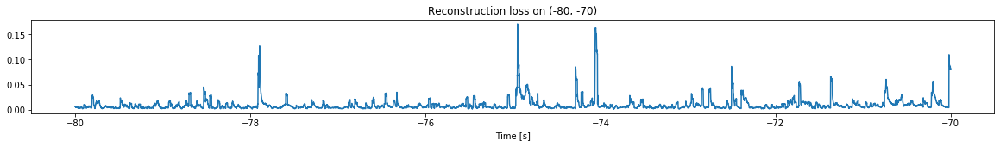

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


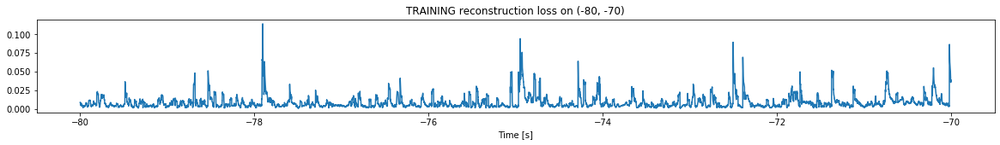

Finished training, median of the log(loss) is:  -2.2085631007874866
Triggering for section:  (-70, -60)
Using this median for triggering: -2.150699047973789


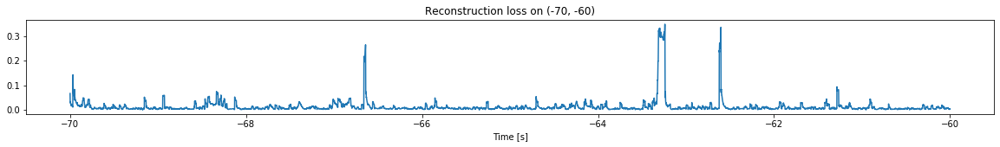

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


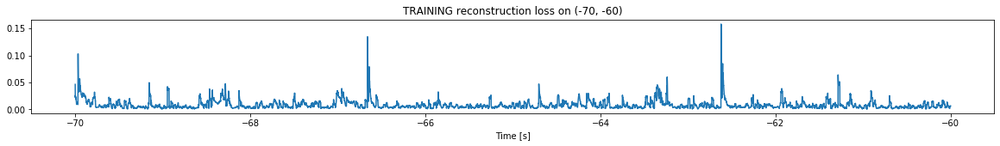

Finished training, median of the log(loss) is:  -2.2036554611055656
Triggering for section:  (-60, -50)
Using this median for triggering: -2.2085631007874866


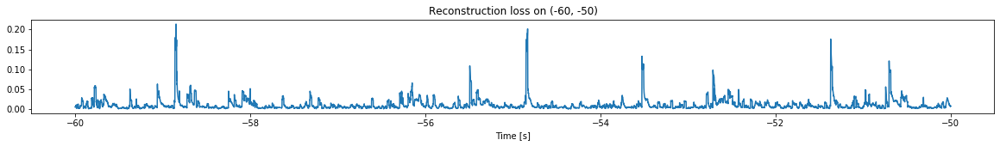

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


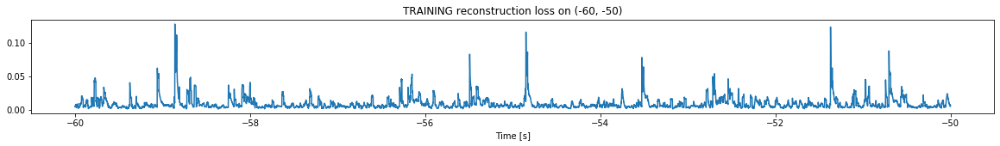

Finished training, median of the log(loss) is:  -2.205276152170032
Triggering for section:  (-50, -40)
Using this median for triggering: -2.2036554611055656


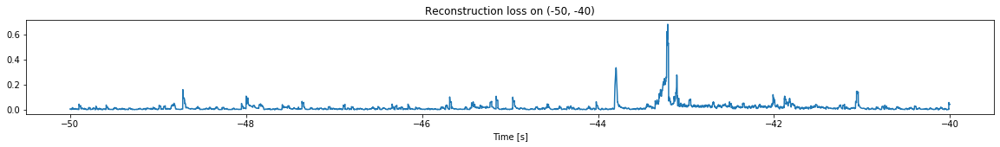

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


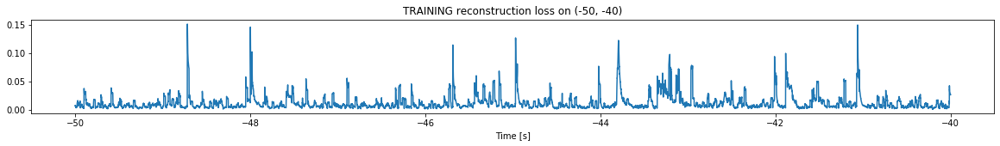

Finished training, median of the log(loss) is:  -2.0919003518153687
Triggering for section:  (-40, -30)
Using this median for triggering: -2.205276152170032


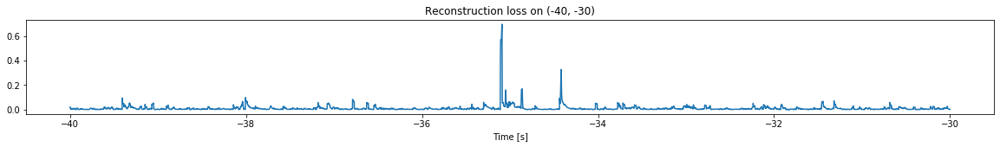

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


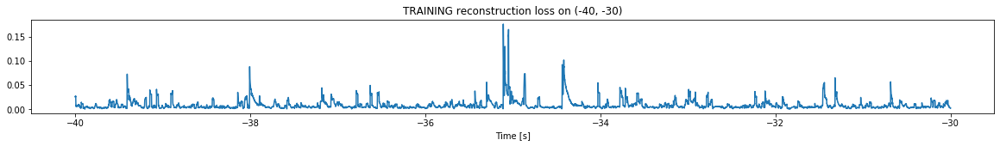

Finished training, median of the log(loss) is:  -2.224305109200225
Triggering for section:  (-30, -20)
Using this median for triggering: -2.0919003518153687


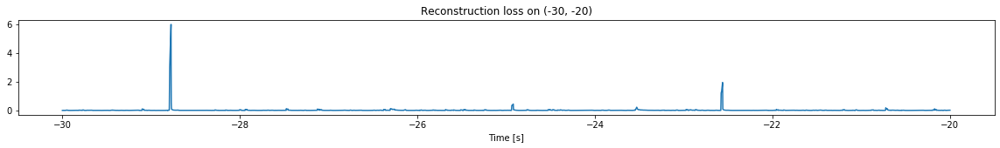

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


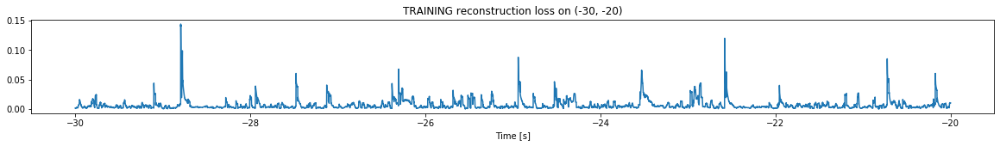

Finished training, median of the log(loss) is:  -2.3445123576942155
Triggering for section:  (-20, -10)
Using this median for triggering: -2.224305109200225


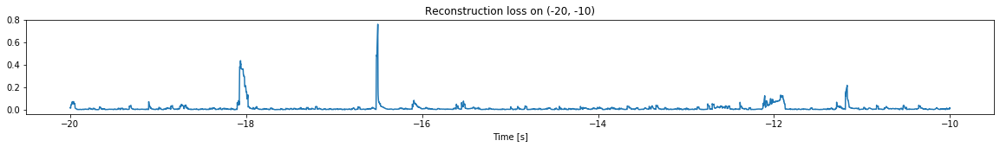

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


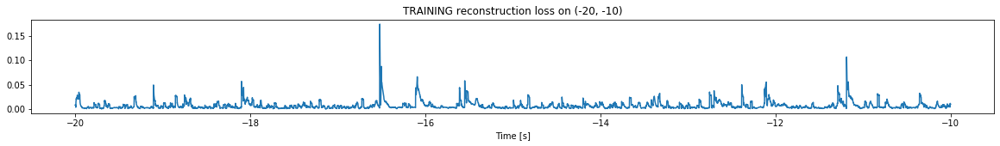

Finished training, median of the log(loss) is:  -2.3113548006125755
Triggering for section:  (-10, 0)
Using this median for triggering: -2.3445123576942155


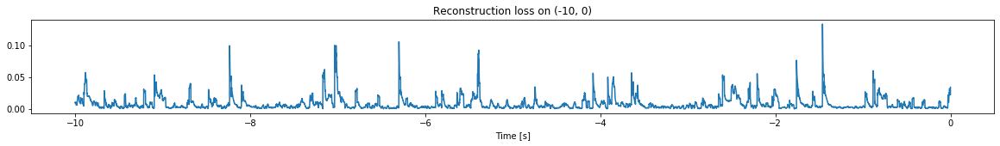

<--------
Finished simulation, all the triggered times are:  [-115.594284, -108.08699, -102.25509, -101.565186, -100.89019, -100.09749, -99.50759, -98.41479, -97.88289, -96.84489, -96.22979, -95.71519, -95.19009, -94.50299, -93.92869, -93.24849, -92.47909, -91.667984, -91.11249, -90.178185, -89.74009, -88.06829, -84.518585, -83.494286, -81.06109, -80.09059]


In [13]:
simulation("./data/Ramp19/", 10, (-195,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1949800, 13)
Flushing input history
Number of sections: 19
Entering sections:  (-190, -180)
-------->
Entering sections:  (-180, -170)
-------->
Training for section:  (None, -180)


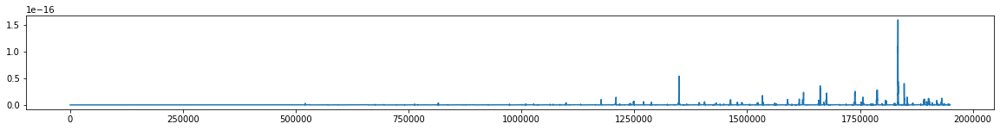

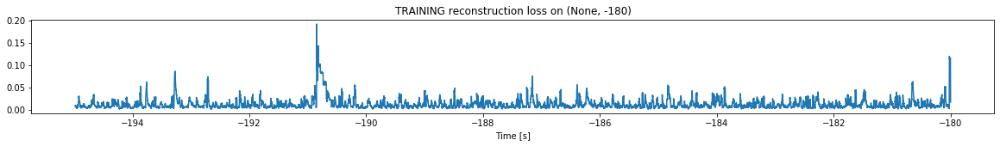

Finished training, median of the log(loss) is:  -2.050125006546974
<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


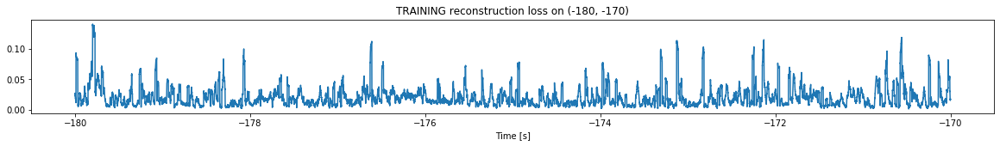

Finished training, median of the log(loss) is:  -1.7758935317408078
Triggering for section:  (-170, -160)
Using this median for triggering: -2.050125006546974


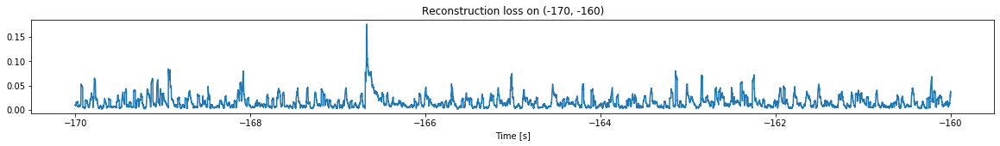

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


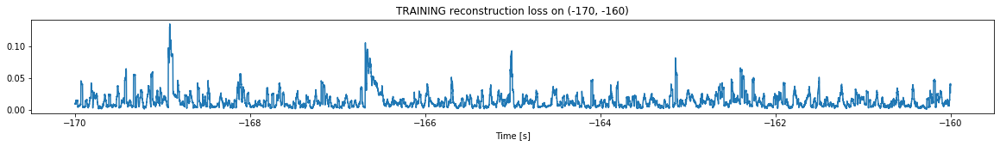

Finished training, median of the log(loss) is:  -1.9793282092579483
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7758935317408078


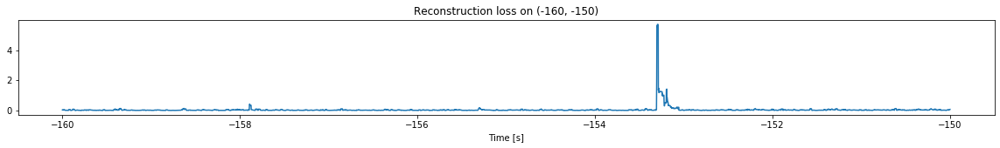

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


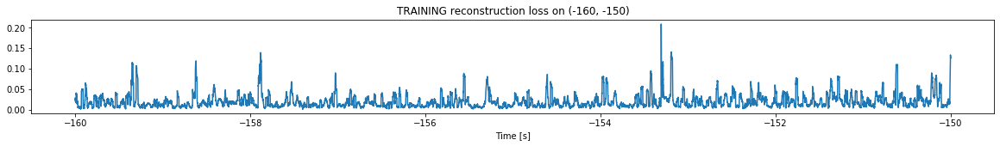

Finished training, median of the log(loss) is:  -1.7975001266732193
Triggering for section:  (-150, -140)
Using this median for triggering: -1.9793282092579483


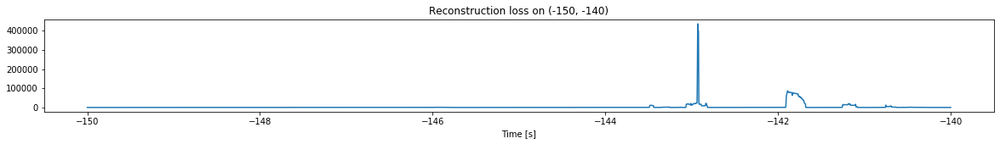

Other trigger time:  [-147.86859 -145.93729 -145.09099 -144.53589 -144.03558 -143.45898
 -142.92929 -142.41579 -141.88719 -141.18549 -140.68428]
Their log loss values are:  [3.37809764 5.08775831 3.56513703 3.73676285 4.42640937 6.04375823
 7.61886547 3.90493677 6.9183394  6.27001351 5.2690752 ]


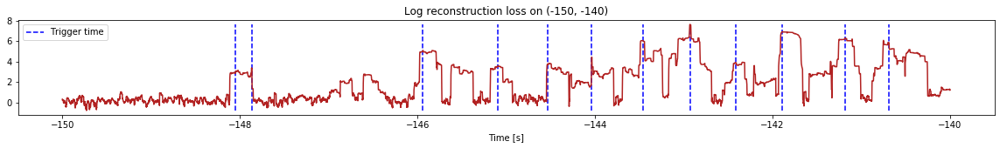

Triggered at:  [-147.86859, -145.93729, -145.09099, -144.53589, -144.03558, -143.45898, -142.92929, -142.41579, -141.88719, -141.18549, -140.68428]
<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


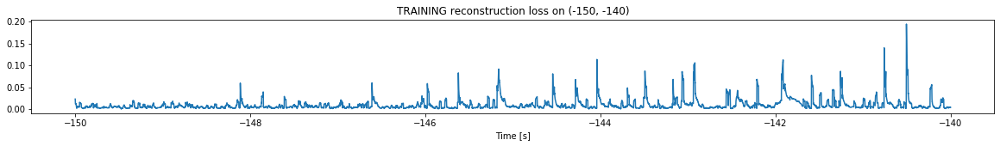

Finished training, median of the log(loss) is:  -2.1979016863452845
Triggering for section:  (-140, -130)
Using this median for triggering: -1.7975001266732193


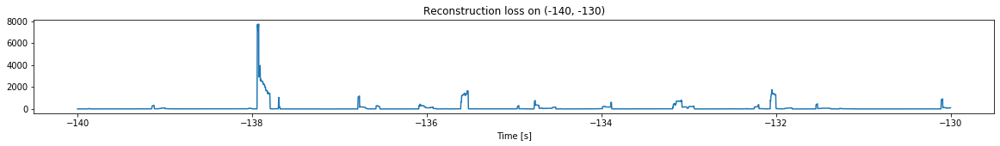

Other trigger time:  [-139.85579 -139.12608 -137.92468 -136.7705  -136.07169 -135.5382
 -134.75859 -133.88539 -133.0866  -132.04749 -131.52489 -130.09099]
Their log loss values are:  [3.42018538 4.3152814  5.68547028 4.87033582 4.42798565 5.01352259
 4.67505603 4.58090322 4.70346311 5.0433466  4.4652355  4.76261638]


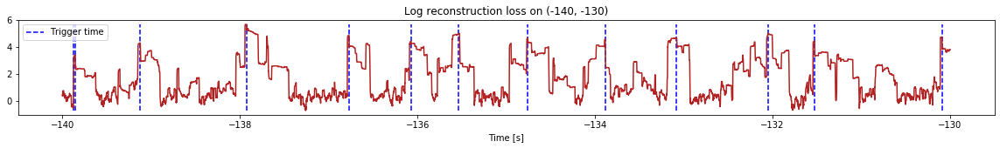

Triggered at:  [-139.85579, -139.12608, -137.92468, -136.7705, -136.07169, -135.5382, -134.75859, -133.88539, -133.0866, -132.04749, -131.52489, -130.09099]
<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


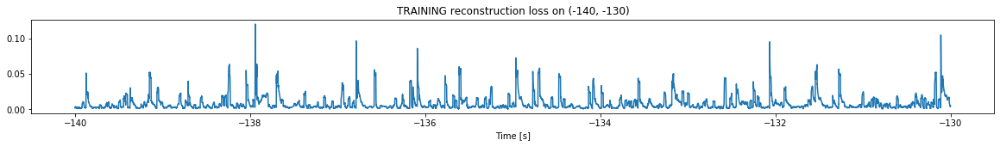

Finished training, median of the log(loss) is:  -2.286365438577108
Triggering for section:  (-130, -120)
Using this median for triggering: -2.1979016863452845


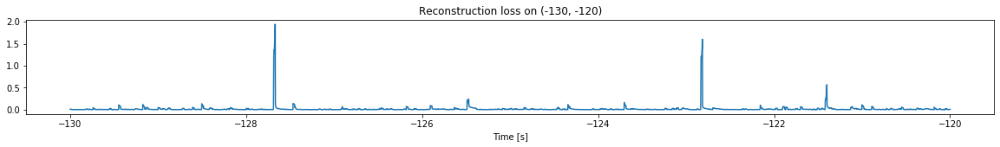

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


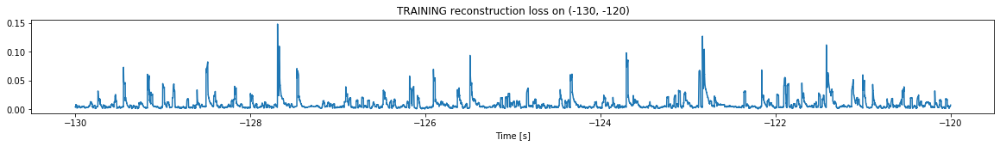

Finished training, median of the log(loss) is:  -2.237017316714582
Triggering for section:  (-120, -110)
Using this median for triggering: -2.286365438577108


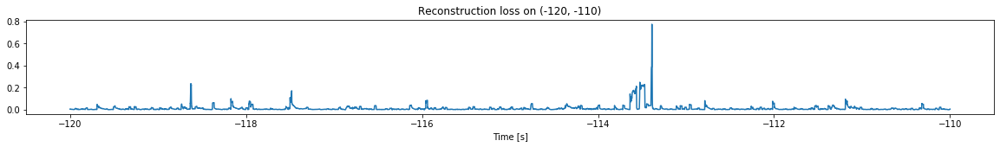

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


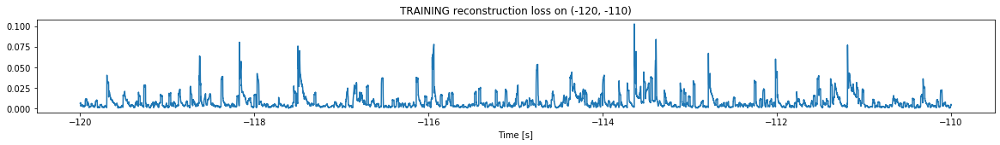

Finished training, median of the log(loss) is:  -2.2886385998038437
Triggering for section:  (-110, -100)
Using this median for triggering: -2.237017316714582


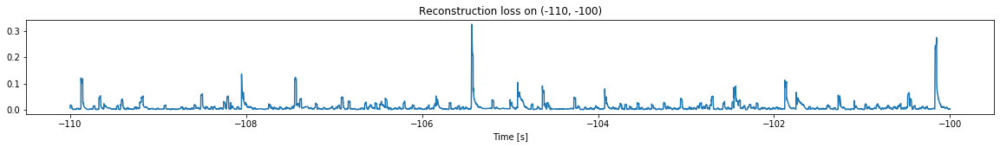

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


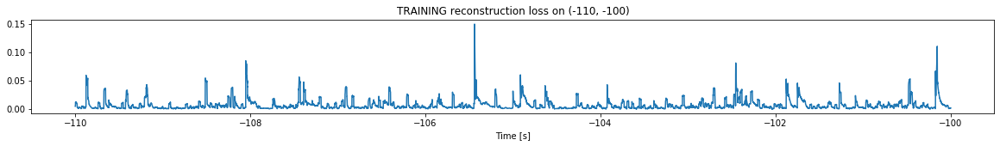

Finished training, median of the log(loss) is:  -2.316828588960697
Triggering for section:  (-100, -90)
Using this median for triggering: -2.2886385998038437


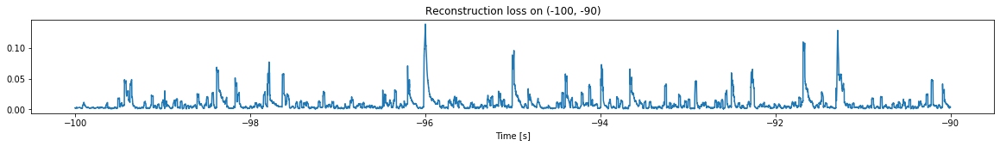

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


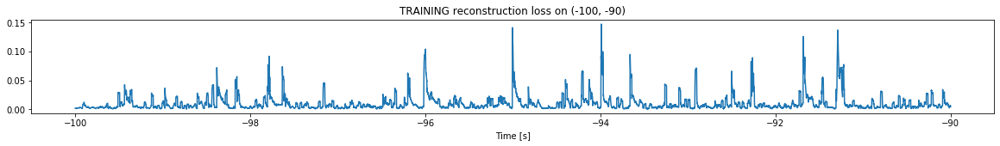

Finished training, median of the log(loss) is:  -2.199202920582307
Triggering for section:  (-90, -80)
Using this median for triggering: -2.316828588960697


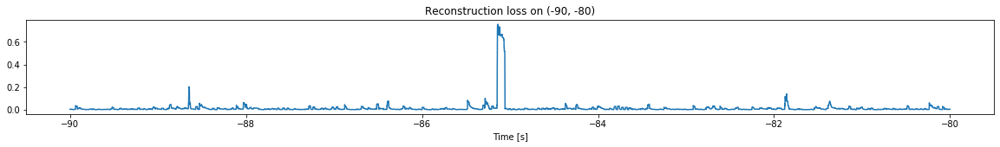

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


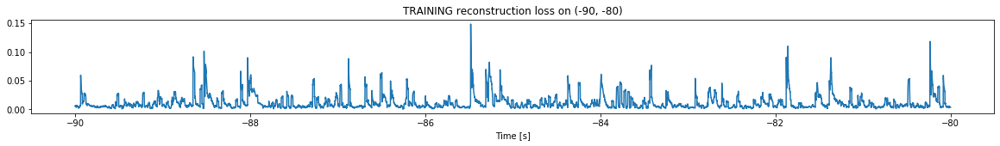

Finished training, median of the log(loss) is:  -2.1273802076466115
Triggering for section:  (-80, -70)
Using this median for triggering: -2.199202920582307


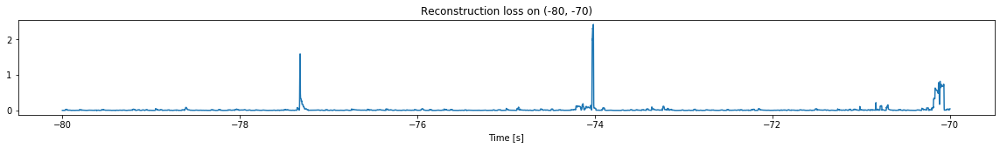

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


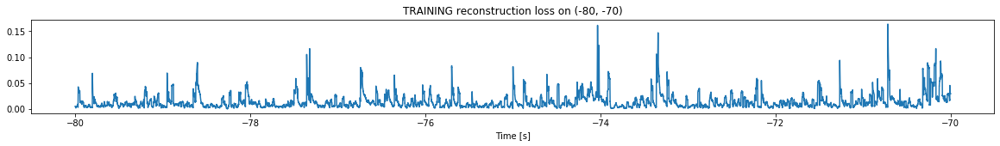

Finished training, median of the log(loss) is:  -1.9788394295026657
Triggering for section:  (-70, -60)
Using this median for triggering: -2.1273802076466115


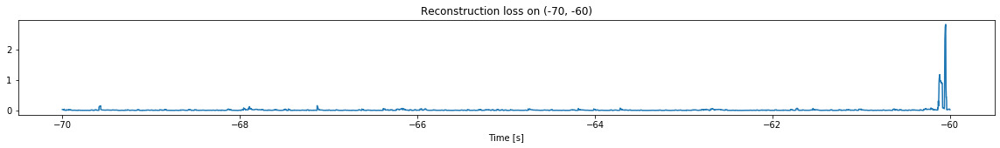

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


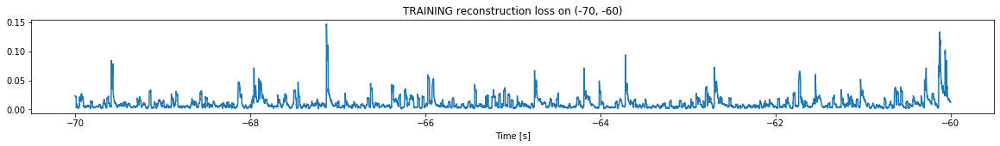

Finished training, median of the log(loss) is:  -2.1458142749219746
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9788394295026657


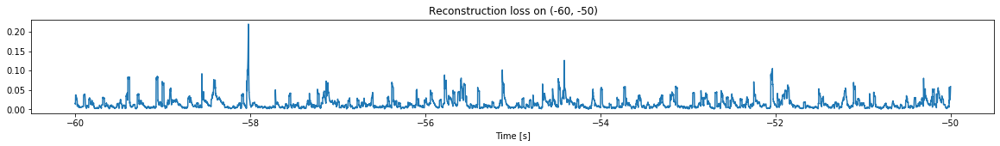

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


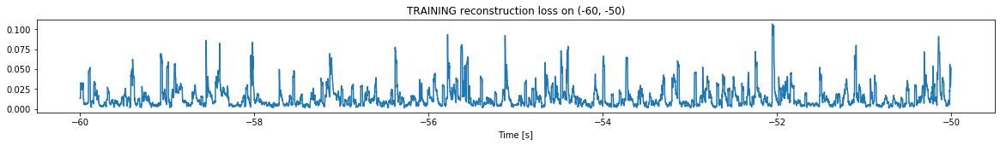

Finished training, median of the log(loss) is:  -1.9852120057561935
Triggering for section:  (-50, -40)
Using this median for triggering: -2.1458142749219746


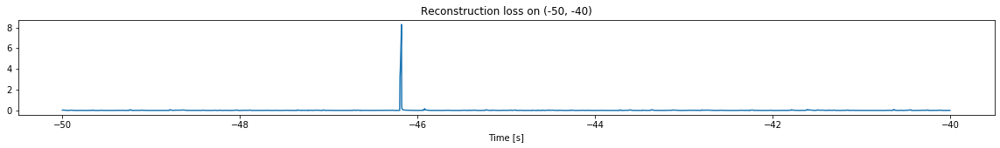

Other trigger time:  [-46.17999]
Their log loss values are:  [3.06448502]


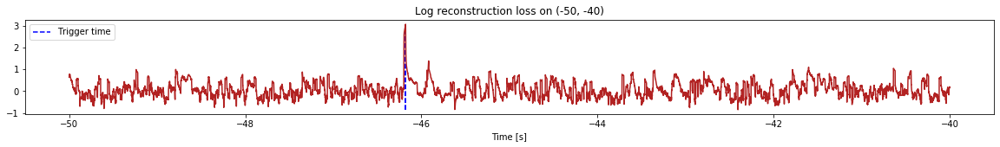

Triggered at:  [-46.17999]
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


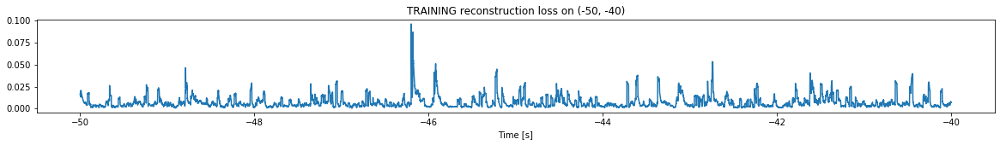

Finished training, median of the log(loss) is:  -2.2897274219368184
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9852120057561935


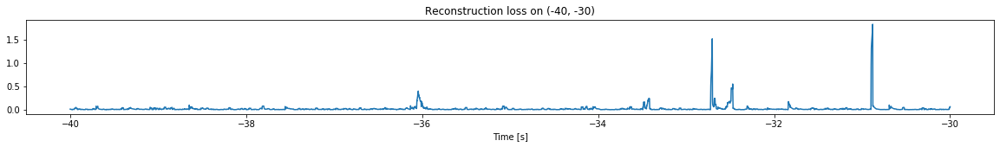

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


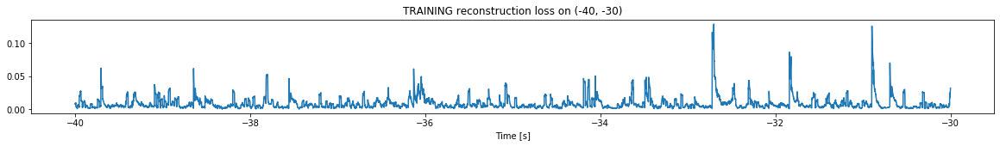

Finished training, median of the log(loss) is:  -2.2031392566844543
Triggering for section:  (-30, -20)
Using this median for triggering: -2.2897274219368184


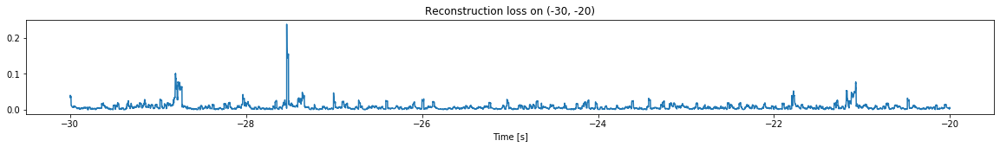

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


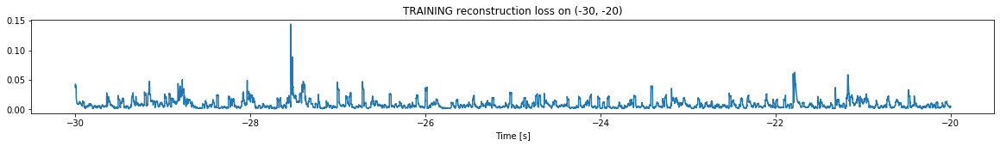

Finished training, median of the log(loss) is:  -2.2005225516928157
Triggering for section:  (-20, -10)
Using this median for triggering: -2.2031392566844543


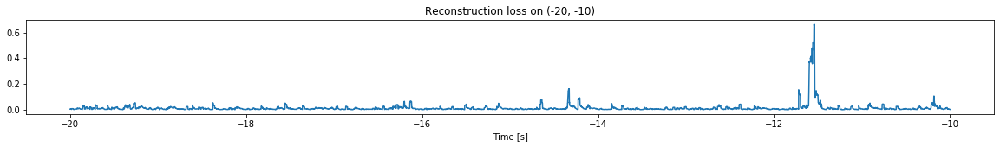

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


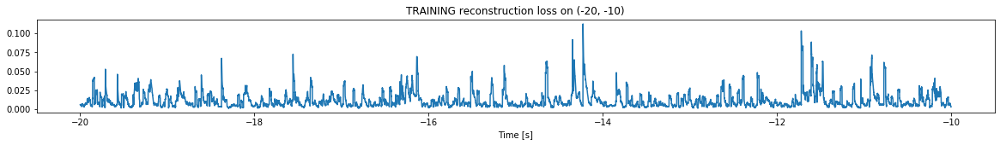

Finished training, median of the log(loss) is:  -2.0909177893652093
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2005225516928157


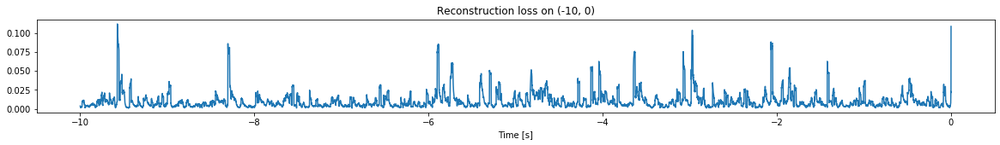

<--------
Finished simulation, all the triggered times are:  [-147.86859, -145.93729, -145.09099, -144.53589, -144.03558, -143.45898, -142.92929, -142.41579, -141.88719, -141.18549, -140.68428, -139.85579, -139.12608, -137.92468, -136.7705, -136.07169, -135.5382, -134.75859, -133.88539, -133.0866, -132.04749, -131.52489, -130.09099, -46.17999]


In [14]:
simulation("./data/Ramp20/", 10, (-195,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1199800, 13)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


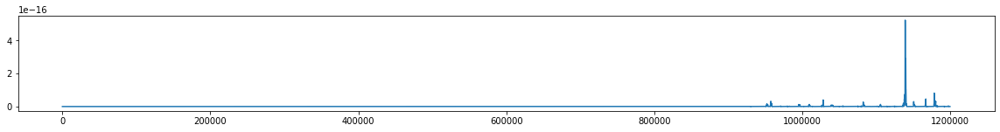

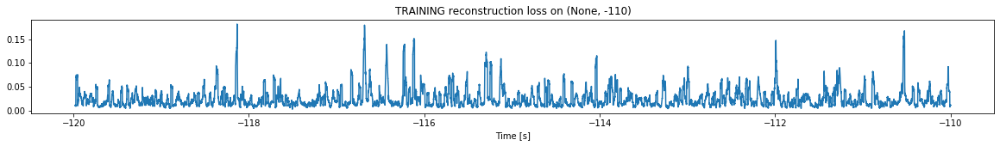

Finished training, median of the log(loss) is:  -1.7193194430205525
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


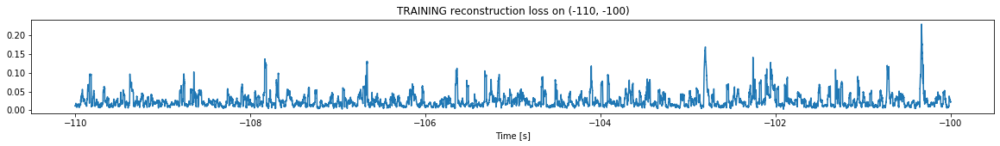

Finished training, median of the log(loss) is:  -1.7044445169636315
Triggering for section:  (-100, -90)
Using this median for triggering: -1.7193194430205525


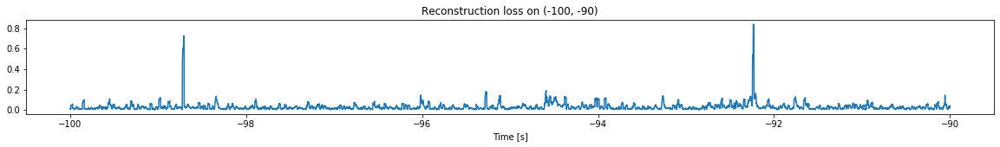

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


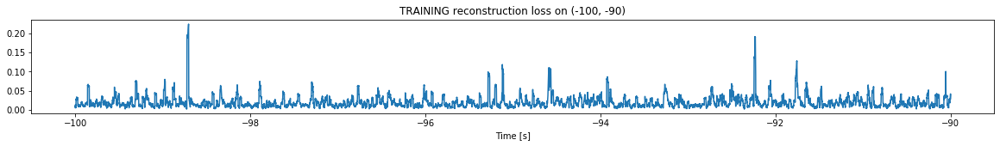

Finished training, median of the log(loss) is:  -1.7902011803292923
Triggering for section:  (-90, -80)
Using this median for triggering: -1.7044445169636315


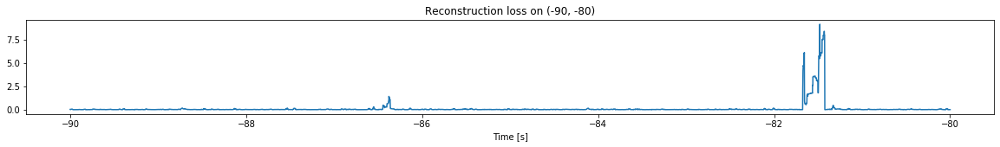

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


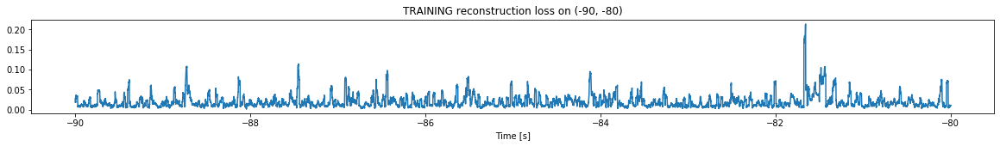

Finished training, median of the log(loss) is:  -1.8087889579692664
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7902011803292923


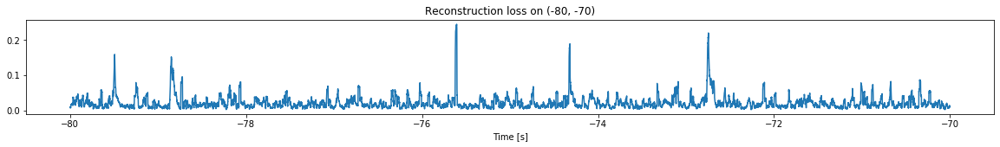

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


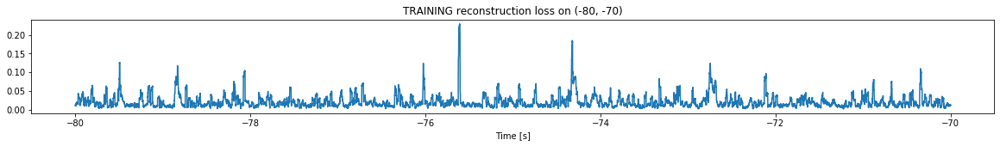

Finished training, median of the log(loss) is:  -1.7626138792094659
Triggering for section:  (-70, -60)
Using this median for triggering: -1.8087889579692664


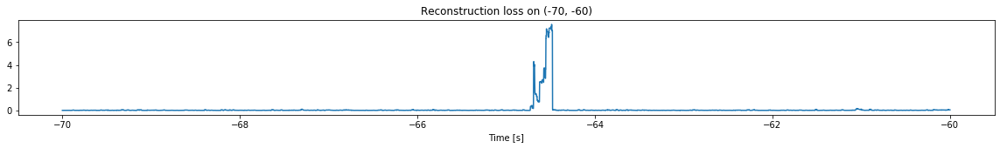

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


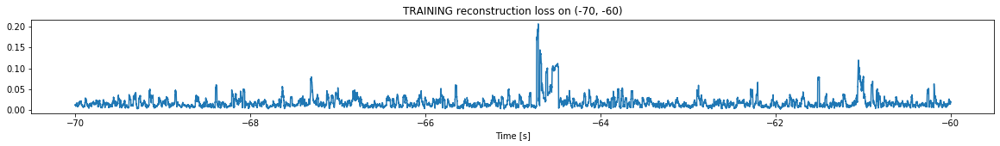

Finished training, median of the log(loss) is:  -1.849811557081515
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7626138792094659


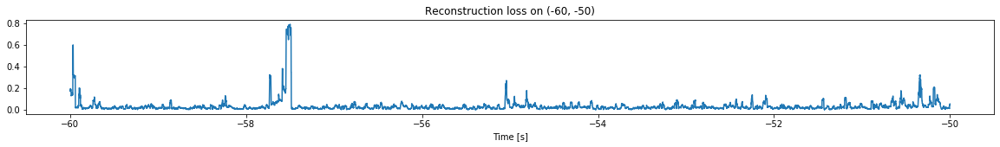

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


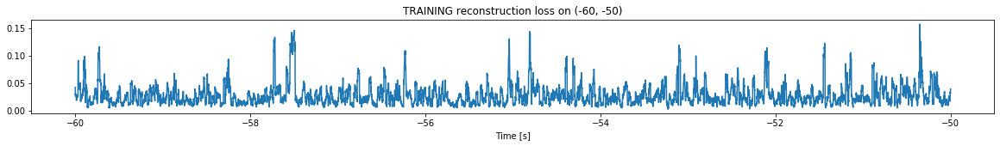

Finished training, median of the log(loss) is:  -1.6294703722699797
Triggering for section:  (-50, -40)
Using this median for triggering: -1.849811557081515


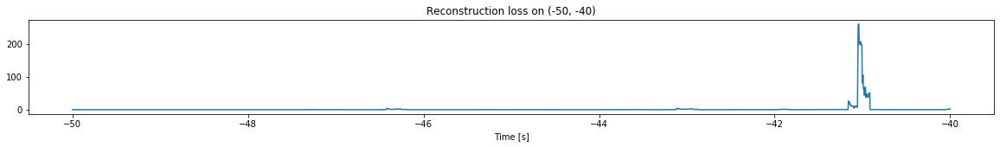

Other trigger time:  [-41.0445]
Their log loss values are:  [4.26466255]


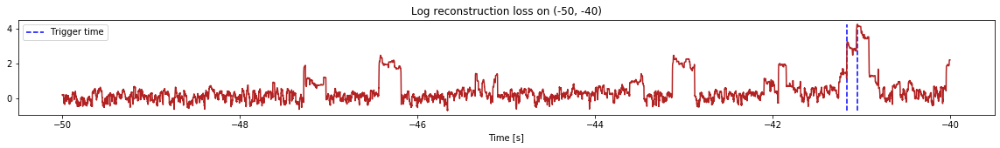

Triggered at:  [-41.0445]
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


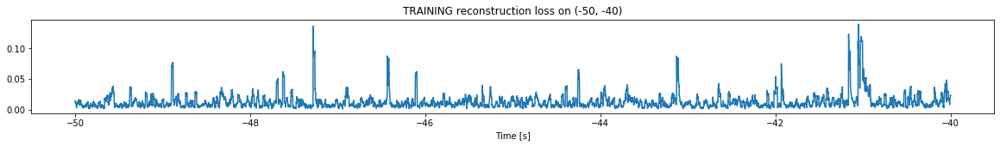

Finished training, median of the log(loss) is:  -1.9808779450296305
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6294703722699797


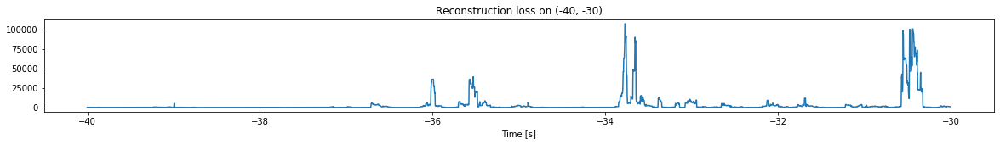

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


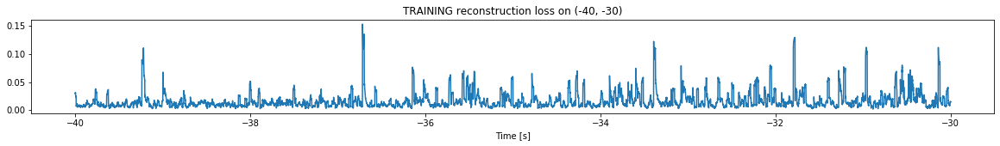

Finished training, median of the log(loss) is:  -1.9042190941519745
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9808779450296305


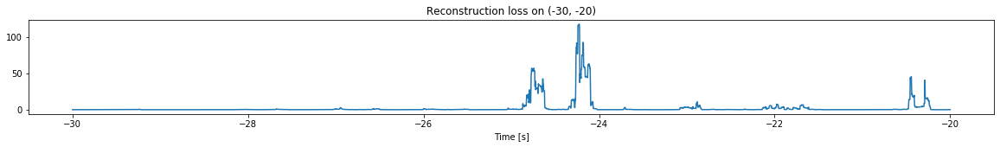

Other trigger time:  [-24.7431 -24.2276 -22.8801 -20.4439]
Their log loss values are:  [3.74002649 4.05309173 3.01765412 3.64118543]


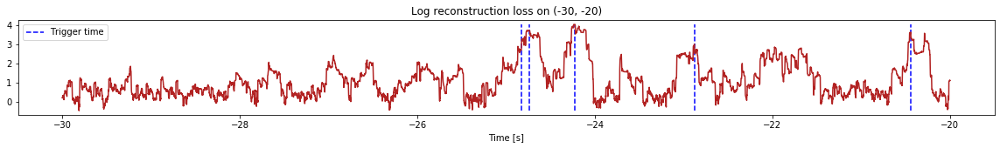

Triggered at:  [-24.7431, -24.2276, -22.8801, -20.4439]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


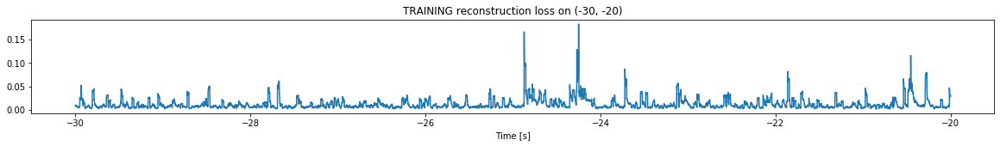

Finished training, median of the log(loss) is:  -2.0953634139162975
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9042190941519745


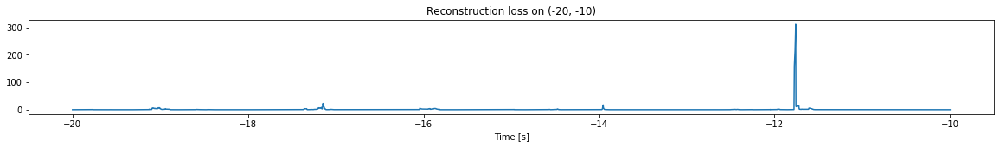

Other trigger time:  [-17.1464 -13.9534 -11.759 ]
Their log loss values are:  [3.26267173 3.14677229 4.39813827]


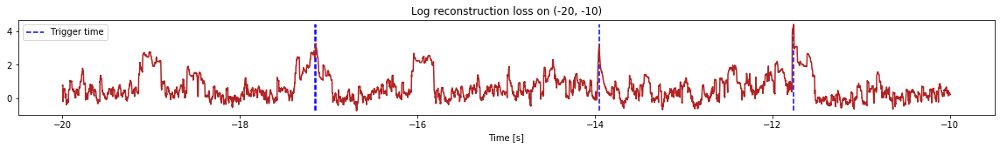

Triggered at:  [-17.1464, -13.9534, -11.759]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


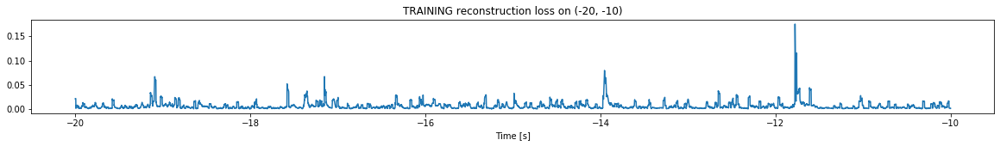

Finished training, median of the log(loss) is:  -2.3260126941485675
Triggering for section:  (-10, 0)
Using this median for triggering: -2.0953634139162975


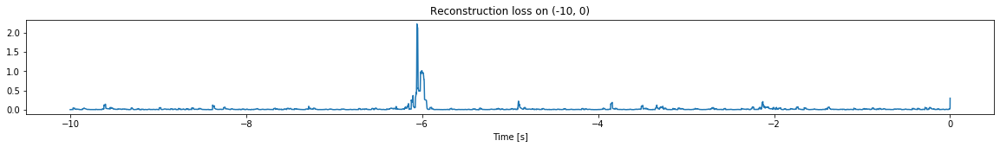

<--------
Finished simulation, all the triggered times are:  [-41.0445, -24.7431, -24.2276, -22.8801, -20.4439, -17.1464, -13.9534, -11.759]


In [15]:
simulation("./data/Ramp21/", 10, (-120,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (799800, 13)
Flushing input history
Number of sections: 8
Entering sections:  (-80, -70)
-------->
Entering sections:  (-70, -60)
-------->
Training for section:  (None, -70)


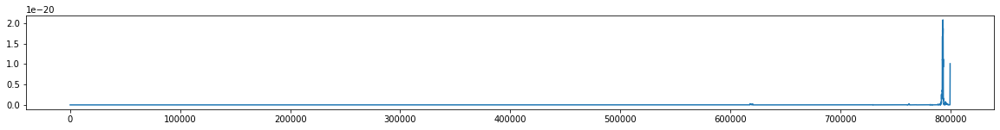

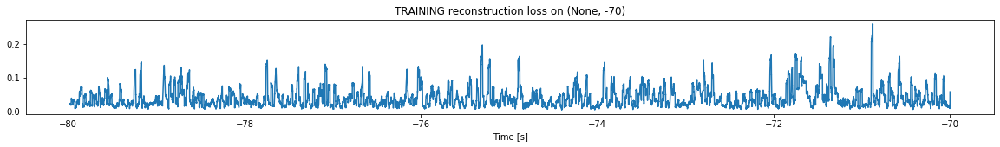

Finished training, median of the log(loss) is:  -1.4818824347913058
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


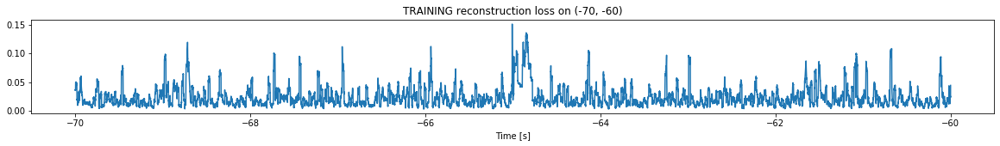

Finished training, median of the log(loss) is:  -1.7199137027830531
Triggering for section:  (-60, -50)
Using this median for triggering: -1.4818824347913058


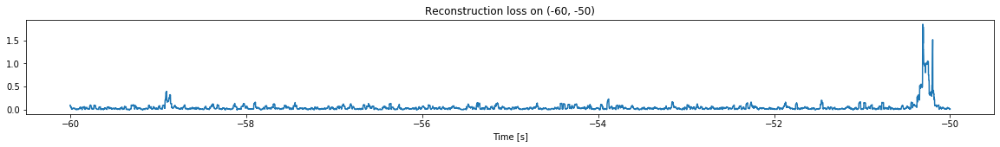

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


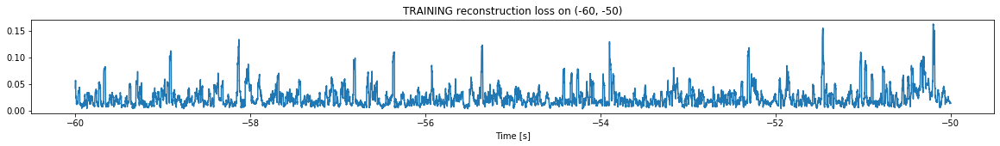

Finished training, median of the log(loss) is:  -1.7231700080643764
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7199137027830531


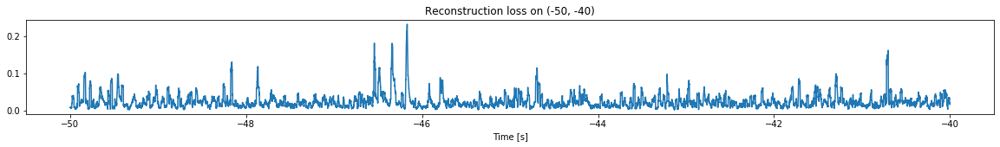

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


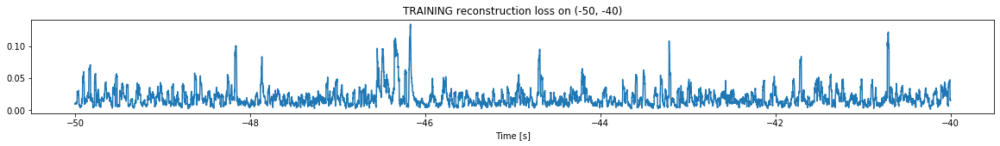

Finished training, median of the log(loss) is:  -1.787319290087943
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7231700080643764


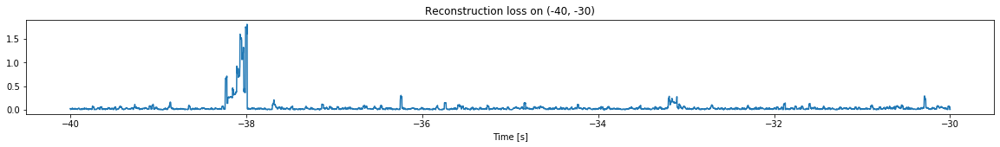

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


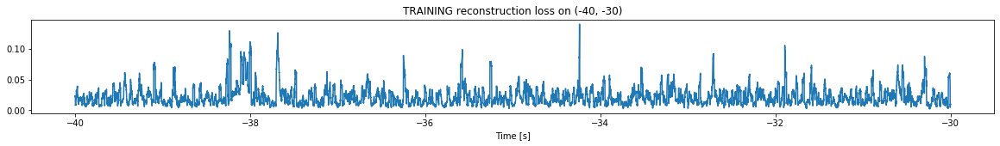

Finished training, median of the log(loss) is:  -1.7320994232039
Triggering for section:  (-30, -20)
Using this median for triggering: -1.787319290087943


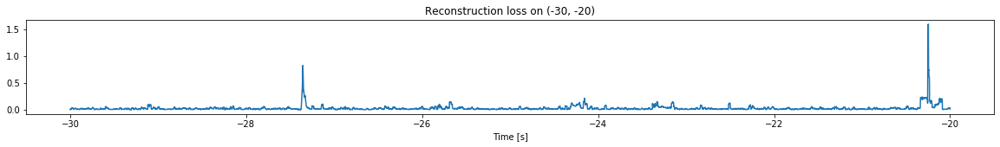

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


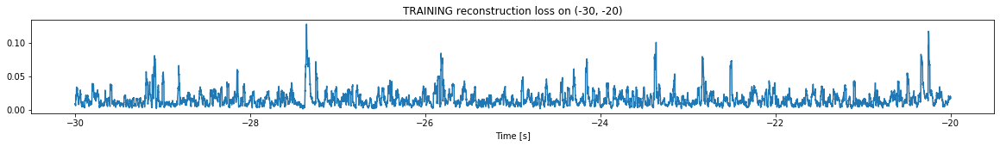

Finished training, median of the log(loss) is:  -1.8727510808706624
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7320994232039


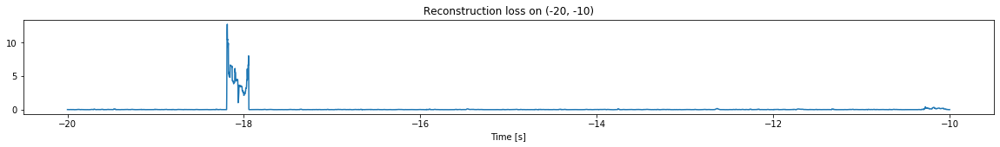

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


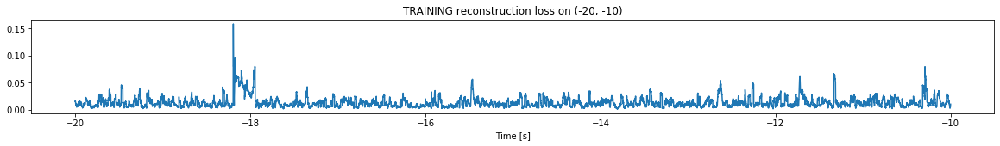

Finished training, median of the log(loss) is:  -1.9510534216822695
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8727510808706624


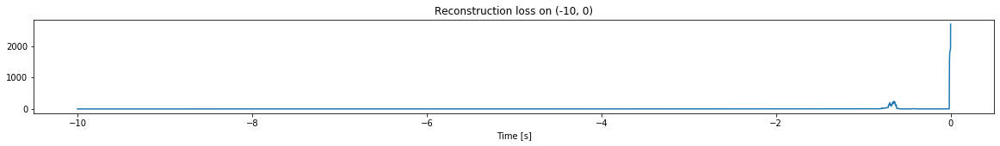

Other trigger time:  [-0.6508 -0.0014]
Their log loss values are:  [4.26011426 5.1538623 ]


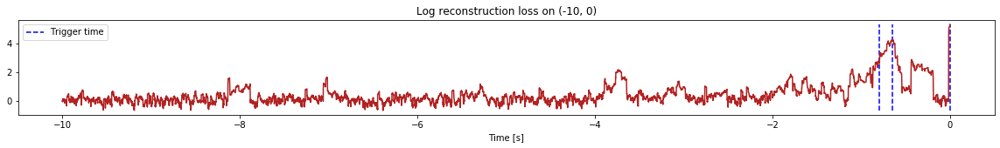

Triggered at:  [-0.6508, -0.0014]
<--------
Finished simulation, all the triggered times are:  [-0.6508, -0.0014]


In [16]:
simulation("./data/Ramp22/", 10, (-80,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 13)
Flushing input history
Number of sections: 5
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


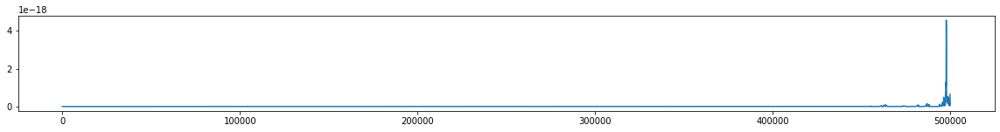

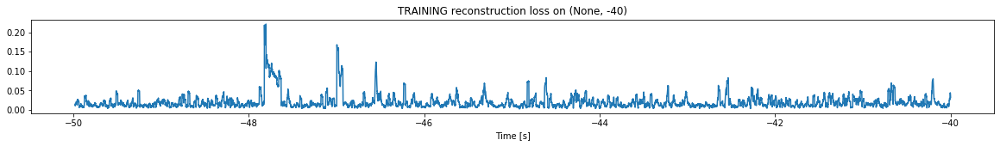

Finished training, median of the log(loss) is:  -1.810708203096527
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


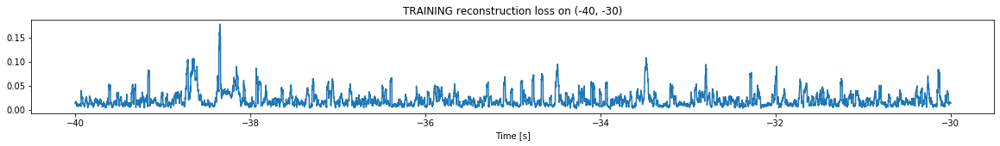

Finished training, median of the log(loss) is:  -1.7701265942073159
Triggering for section:  (-30, -20)
Using this median for triggering: -1.810708203096527


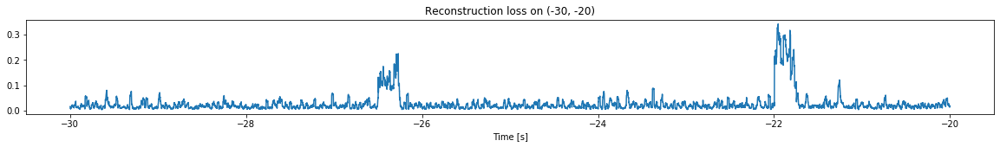

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


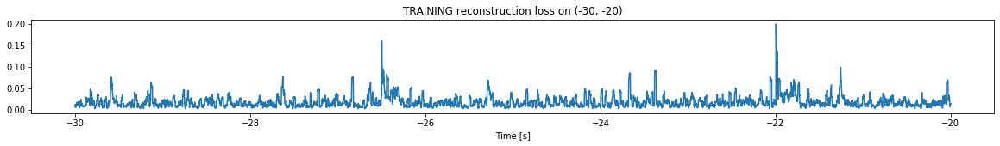

Finished training, median of the log(loss) is:  -1.8044391965938051
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7701265942073159


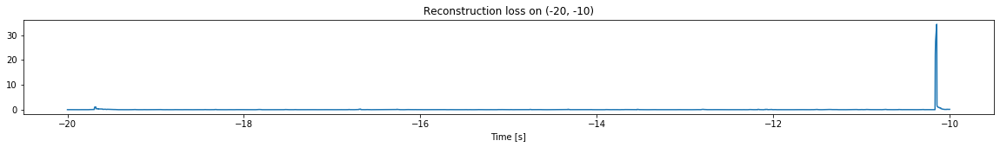

Other trigger time:  [-10.1461]
Their log loss values are:  [3.30638771]


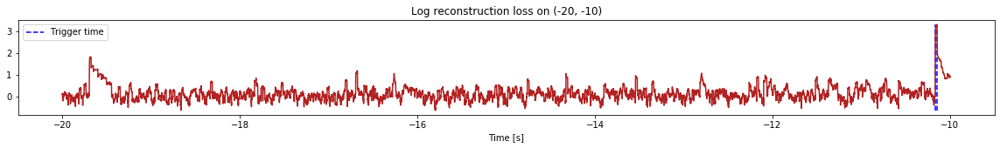

Triggered at:  [-10.1461]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


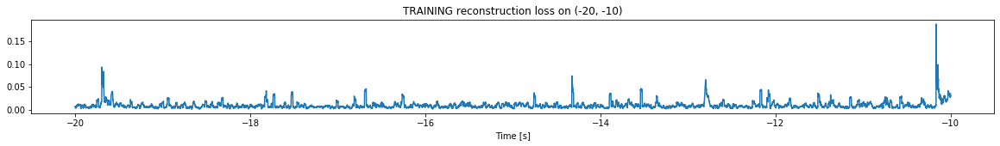

Finished training, median of the log(loss) is:  -2.122104551206574
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8044391965938051


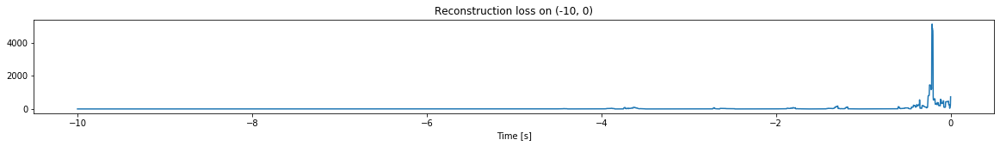

Other trigger time:  [-4.4270997 -3.6151    -2.7054    -1.8057    -1.2943    -0.212    ]
Their log loss values are:  [3.15275243 3.80464892 3.69214126 3.72476261 4.05142763 5.51436834]


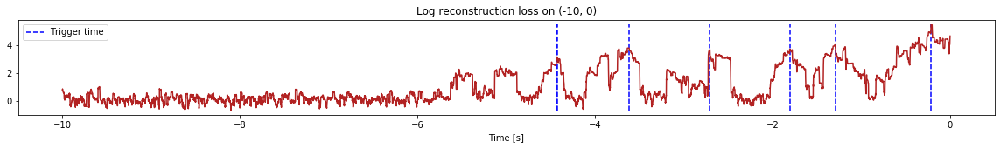

Triggered at:  [-4.4270997, -3.6151, -2.7054, -1.8057, -1.2943, -0.212]
<--------
Finished simulation, all the triggered times are:  [-10.1461, -4.4270997, -3.6151, -2.7054, -1.8057, -1.2943, -0.212]


In [17]:
simulation("./data/Ramp23/", 10, (-50,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1099800, 13)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


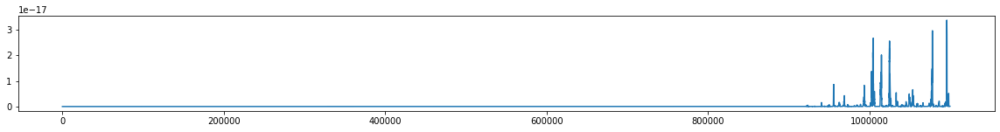

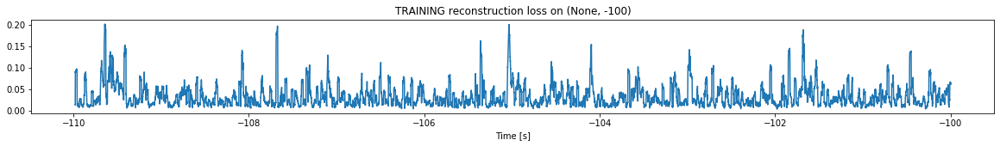

Finished training, median of the log(loss) is:  -1.5805050939376393
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


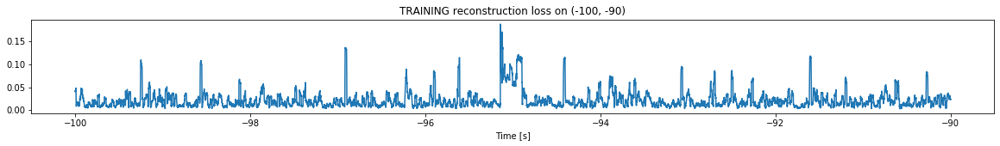

Finished training, median of the log(loss) is:  -1.7762627577900472
Triggering for section:  (-90, -80)
Using this median for triggering: -1.5805050939376393


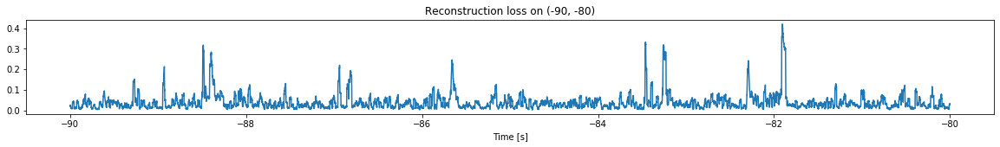

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


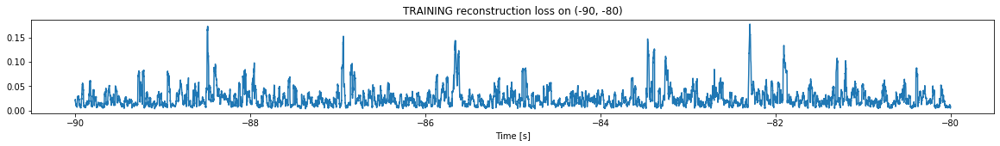

Finished training, median of the log(loss) is:  -1.688136311446266
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7762627577900472


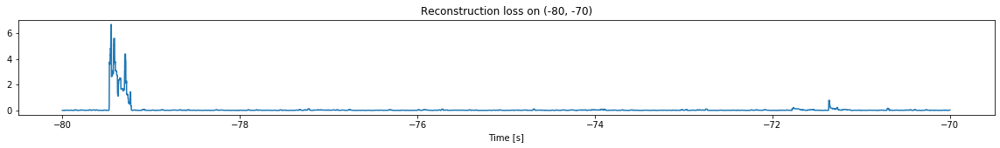

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


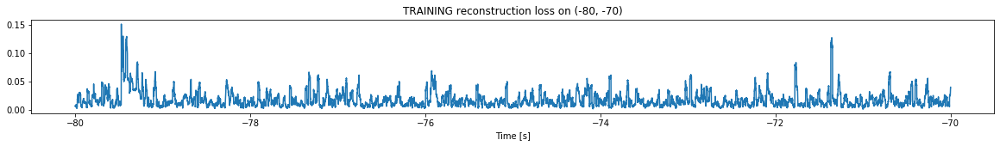

Finished training, median of the log(loss) is:  -1.8423356260507138
Triggering for section:  (-70, -60)
Using this median for triggering: -1.688136311446266


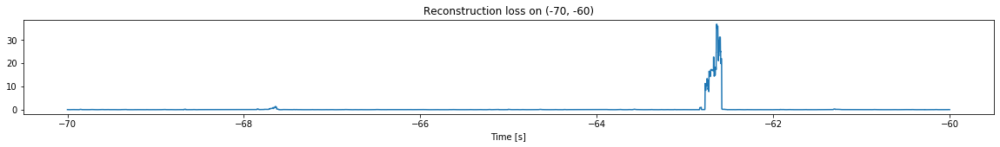

Other trigger time:  [-62.643597]
Their log loss values are:  [3.25484227]


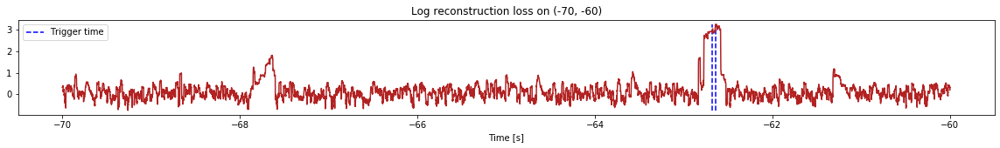

Triggered at:  [-62.643597]
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


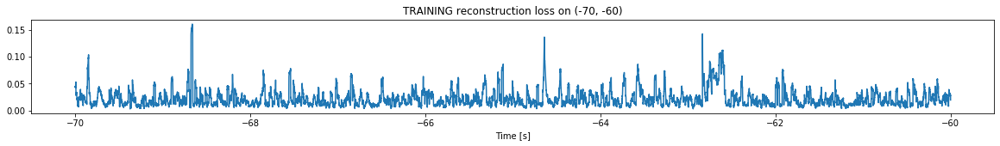

Finished training, median of the log(loss) is:  -1.75361334219743
Triggering for section:  (-60, -50)
Using this median for triggering: -1.8423356260507138


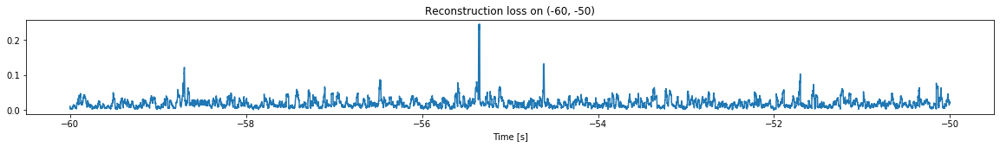

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


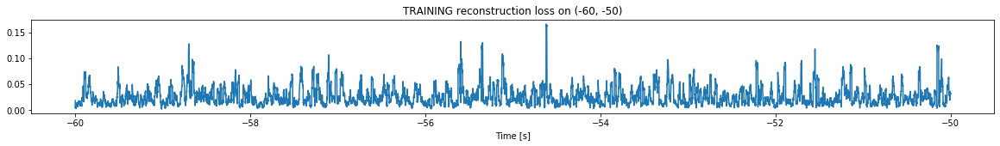

Finished training, median of the log(loss) is:  -1.6453401202311668
Triggering for section:  (-50, -40)
Using this median for triggering: -1.75361334219743


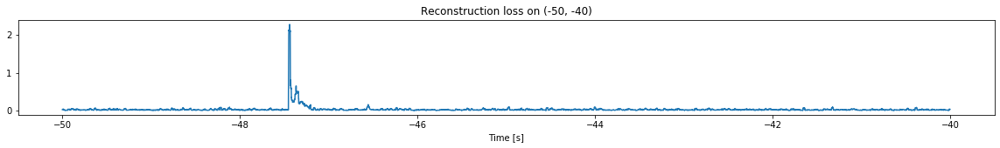

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


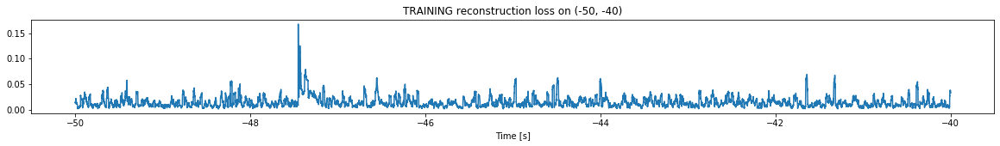

Finished training, median of the log(loss) is:  -1.9192502761885875
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6453401202311668


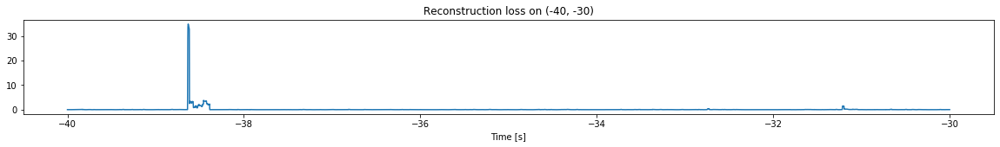

Other trigger time:  [-38.631298]
Their log loss values are:  [3.18671259]


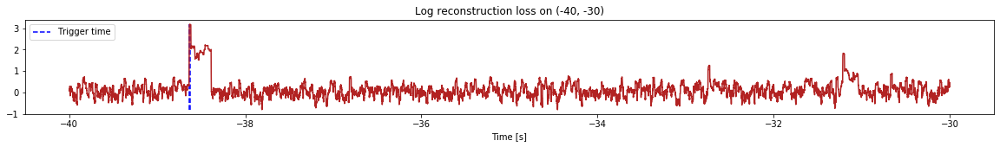

Triggered at:  [-38.631298]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


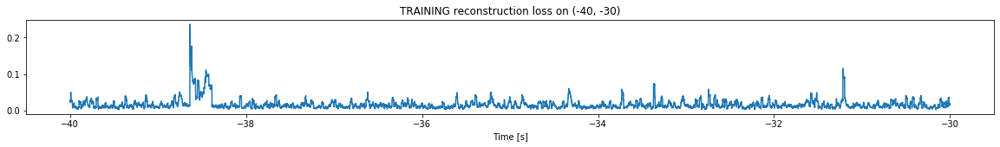

Finished training, median of the log(loss) is:  -1.884025226911827
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9192502761885875


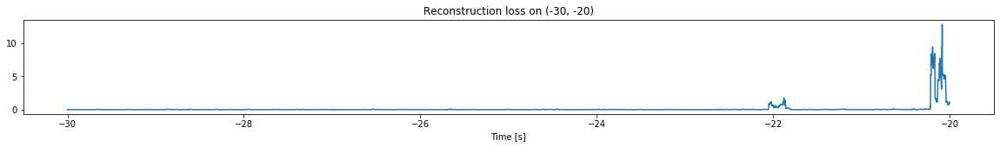

Other trigger time:  [-20.0845]
Their log loss values are:  [3.02798342]


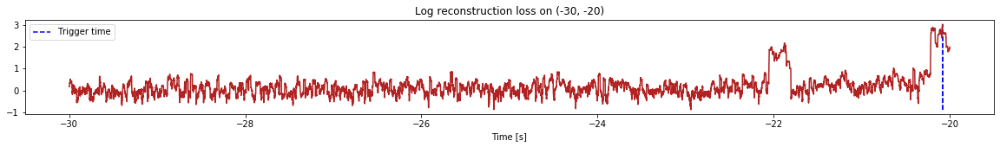

Triggered at:  [-20.0845]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


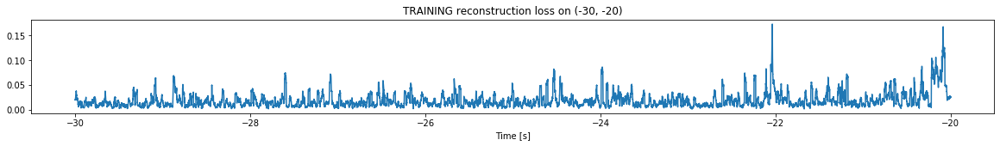

Finished training, median of the log(loss) is:  -1.8104976658230778
Triggering for section:  (-20, -10)
Using this median for triggering: -1.884025226911827


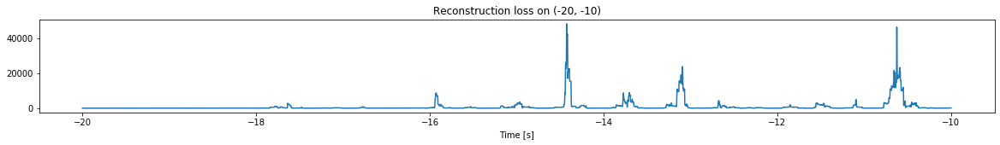

Other trigger time:  [-18.2549   -17.6369   -16.7733   -15.929999 -14.962    -14.424999
 -13.7056   -13.0918   -12.591    -11.5411   -10.6247   -10.033899]
Their log loss values are:  [3.11974456 5.3425385  4.82587464 5.82337982 5.42732586 6.56738014
 5.8307218  6.26064656 4.94191333 5.36905857 6.55130038 3.96951562]


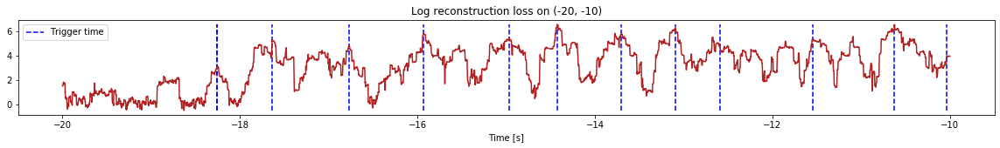

Triggered at:  [-18.2549, -17.6369, -16.7733, -15.929999, -14.962, -14.424999, -13.7056, -13.0918, -12.591, -11.5411, -10.6247, -10.033899]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


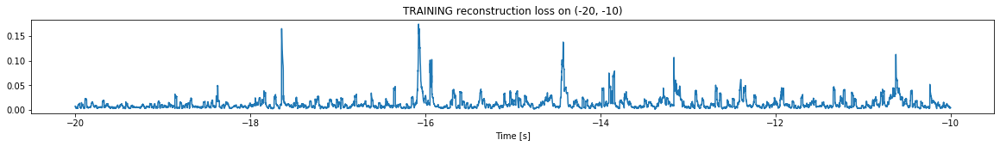

Finished training, median of the log(loss) is:  -2.0496572697793174
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8104976658230778


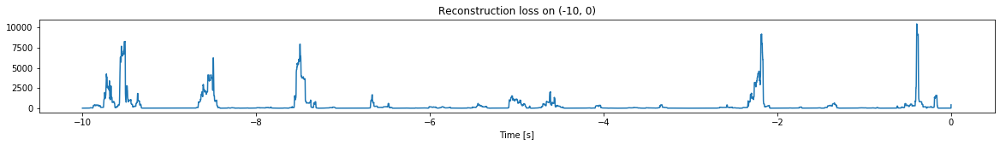

Other trigger time:  [-9.509399   -8.4948     -7.4932     -6.6626     -6.0049996  -5.4437
 -4.6134     -4.042      -3.3406     -2.6862     -2.1826     -1.3424
 -0.39499998]
Their log loss values are:  [5.72873796 5.60654622 5.71034896 5.03481705 4.09714758 4.57757644
 5.12030541 4.36943105 4.44495985 3.31472982 5.77364649 4.62736807
 5.82994513]


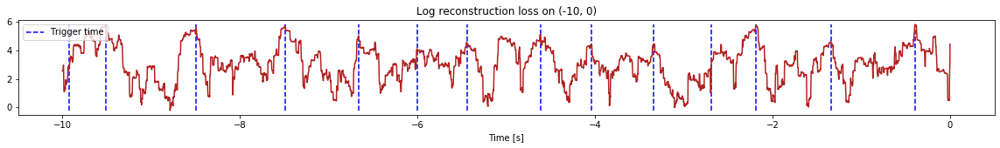

Triggered at:  [-9.509399, -8.4948, -7.4932, -6.6626, -6.0049996, -5.4437, -4.6134, -4.042, -3.3406, -2.6862, -2.1826, -1.3424, -0.39499998]
<--------
Finished simulation, all the triggered times are:  [-62.643597, -38.631298, -20.0845, -18.2549, -17.6369, -16.7733, -15.929999, -14.962, -14.424999, -13.7056, -13.0918, -12.591, -11.5411, -10.6247, -10.033899, -9.509399, -8.4948, -7.4932, -6.6626, -6.0049996, -5.4437, -4.6134, -4.042, -3.3406, -2.6862, -2.1826, -1.3424, -0.39499998]


In [18]:
simulation("./data/Ramp24/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


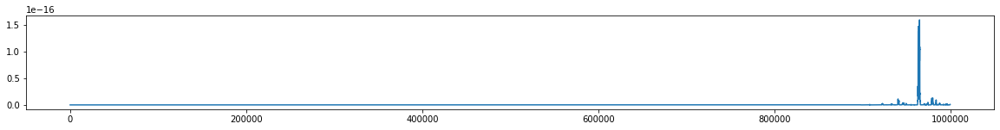

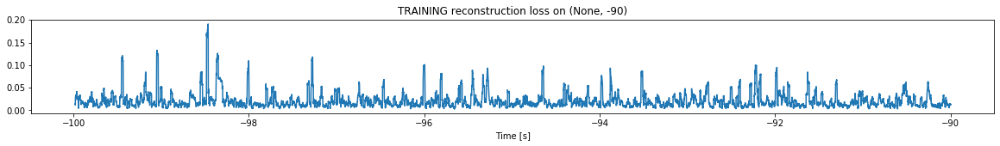

Finished training, median of the log(loss) is:  -1.7828349411619255
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


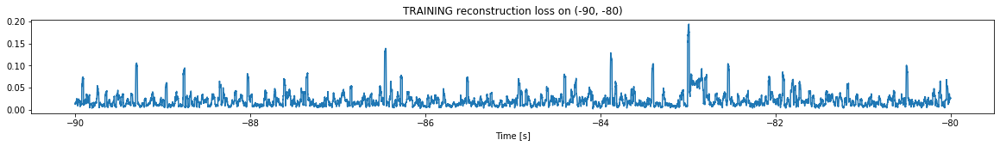

Finished training, median of the log(loss) is:  -1.7621492491319661
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7828349411619255


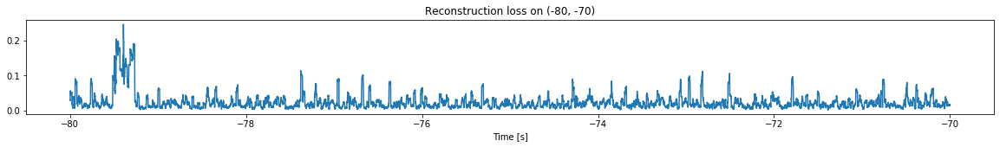

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


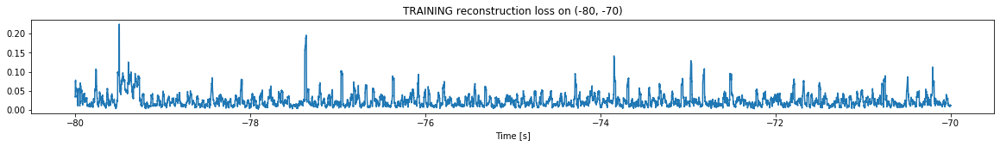

Finished training, median of the log(loss) is:  -1.6961520265195011
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7621492491319661


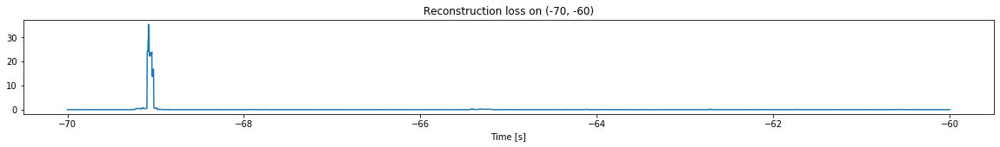

Other trigger time:  [-69.08]
Their log loss values are:  [3.31320332]


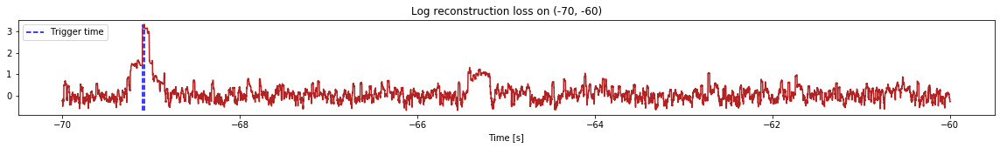

Triggered at:  [-69.08]
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


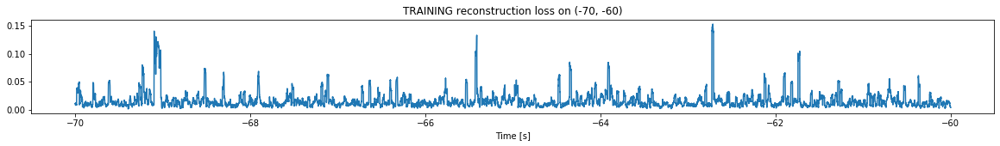

Finished training, median of the log(loss) is:  -1.8922546947814323
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6961520265195011


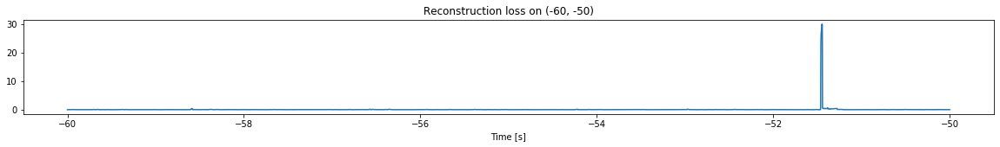

Other trigger time:  [-51.4463]
Their log loss values are:  [3.17245919]


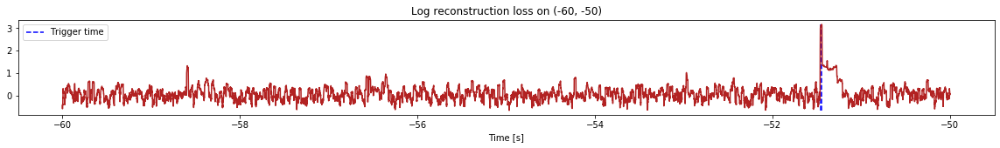

Triggered at:  [-51.4463]
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


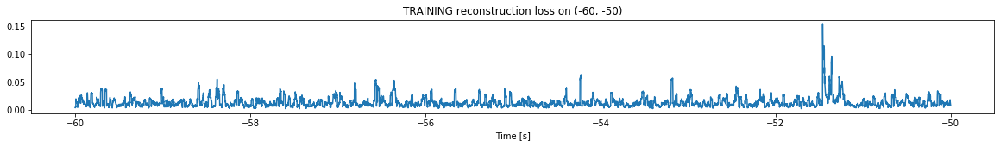

Finished training, median of the log(loss) is:  -1.9560404291885902
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8922546947814323


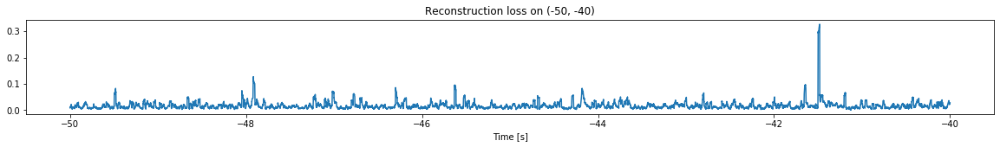

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


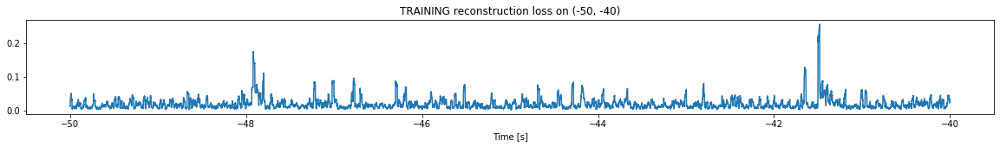

Finished training, median of the log(loss) is:  -1.8108564443484179
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9560404291885902


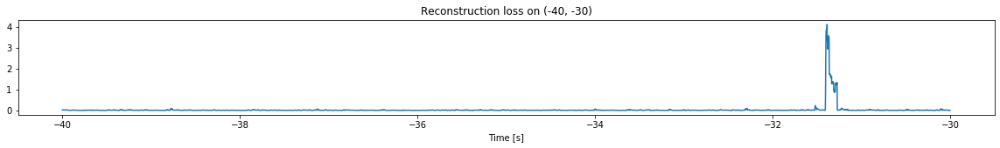

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


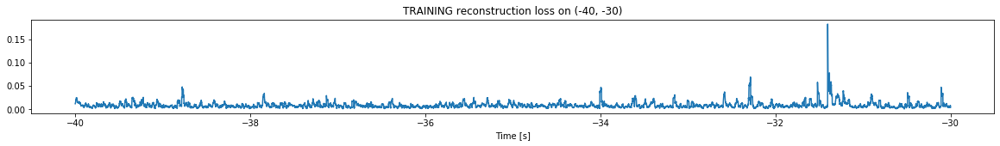

Finished training, median of the log(loss) is:  -2.1173135344264438
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8108564443484179


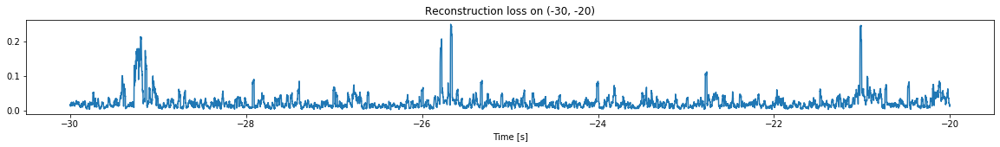

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


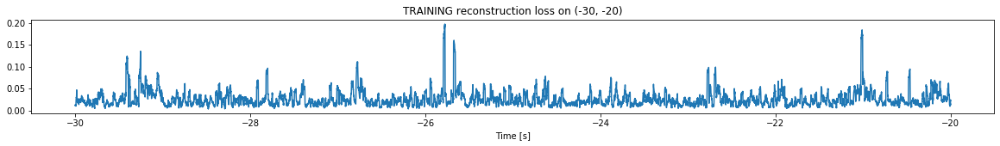

Finished training, median of the log(loss) is:  -1.6609755074615893
Triggering for section:  (-20, -10)
Using this median for triggering: -2.1173135344264438


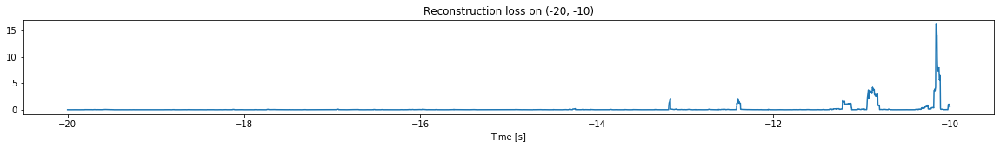

Other trigger time:  [-10.1559]
Their log loss values are:  [3.32603917]


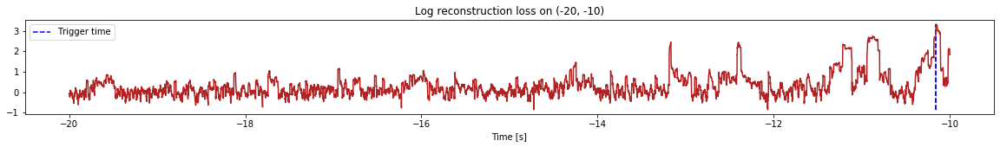

Triggered at:  [-10.1559]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


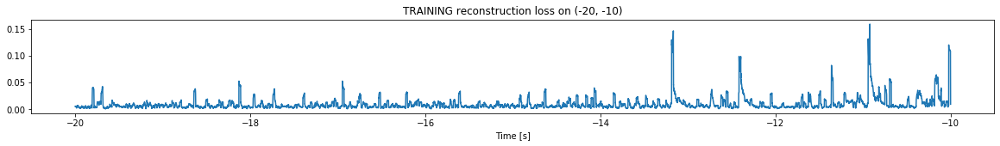

Finished training, median of the log(loss) is:  -2.1712556892554025
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6609755074615893


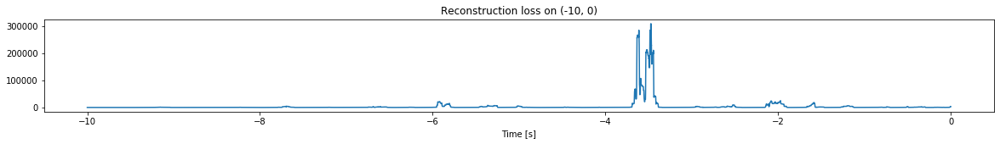

Other trigger time:  [-9.151899  -8.2217    -7.6955    -7.1840997 -6.6043997 -5.9185
 -5.362     -4.4743    -3.9708998 -3.4703999 -2.5193    -1.9708999
 -1.1854    -0.5003   ]
Their log loss values are:  [4.75099134 4.62551739 5.3294046  4.56718134 5.20601487 5.99530373
 5.5516508  4.78714639 3.2744405  7.14999448 5.63158074 6.05931942
 5.47875303 5.20928823]


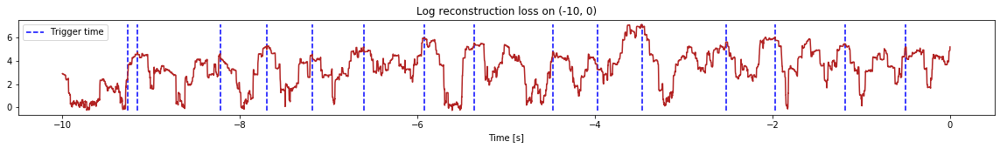

Triggered at:  [-9.151899, -8.2217, -7.6955, -7.1840997, -6.6043997, -5.9185, -5.362, -4.4743, -3.9708998, -3.4703999, -2.5193, -1.9708999, -1.1854, -0.5003]
<--------
Finished simulation, all the triggered times are:  [-69.08, -51.4463, -10.1559, -9.151899, -8.2217, -7.6955, -7.1840997, -6.6043997, -5.9185, -5.362, -4.4743, -3.9708998, -3.4703999, -2.5193, -1.9708999, -1.1854, -0.5003]


In [19]:
simulation("./data/Ramp25/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1099800, 13)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


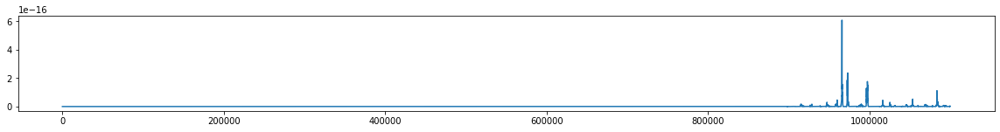

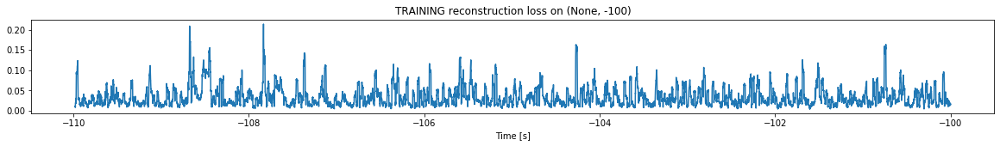

Finished training, median of the log(loss) is:  -1.5562343576111493
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


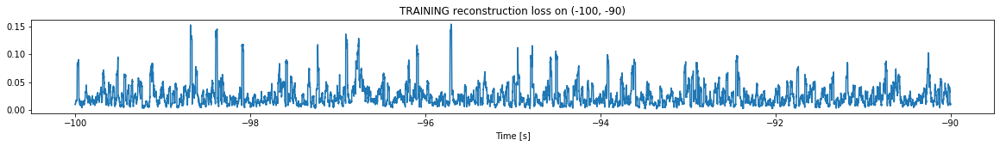

Finished training, median of the log(loss) is:  -1.6761756364836238
Triggering for section:  (-90, -80)
Using this median for triggering: -1.5562343576111493


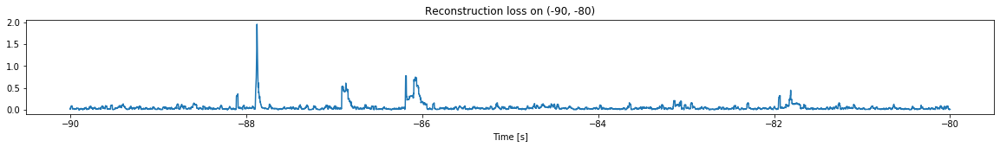

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


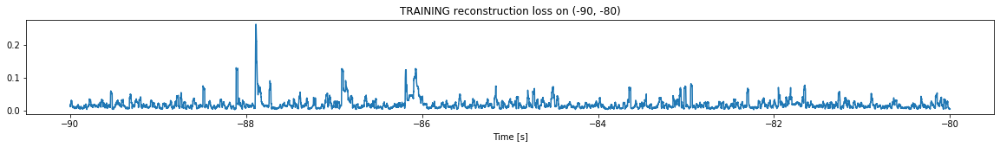

Finished training, median of the log(loss) is:  -1.836905364058527
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6761756364836238


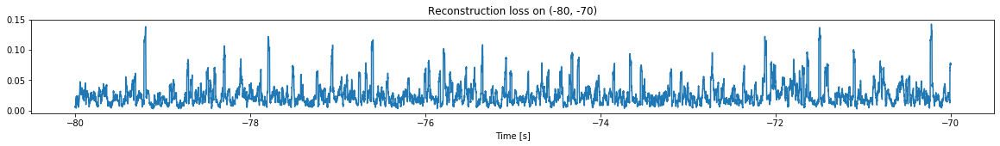

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


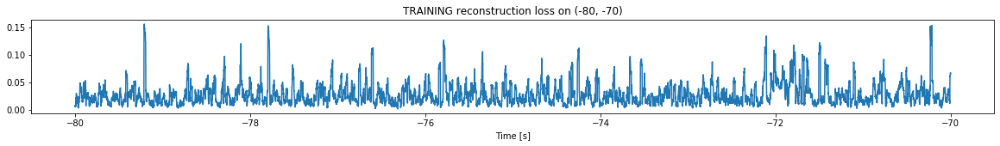

Finished training, median of the log(loss) is:  -1.6255323550453018
Triggering for section:  (-70, -60)
Using this median for triggering: -1.836905364058527


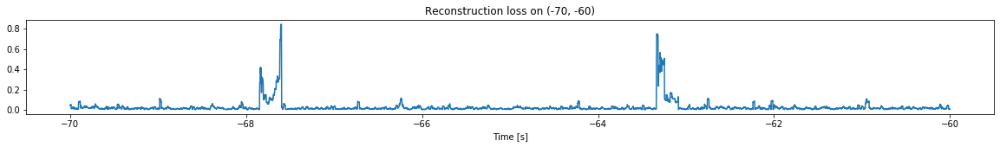

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


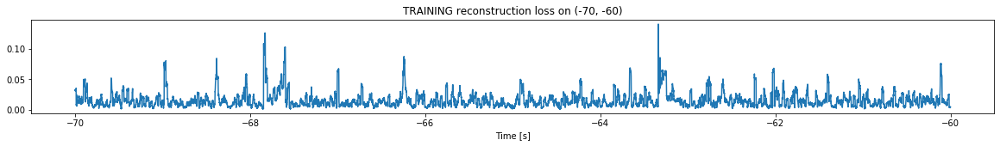

Finished training, median of the log(loss) is:  -1.8685675279709244
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6255323550453018


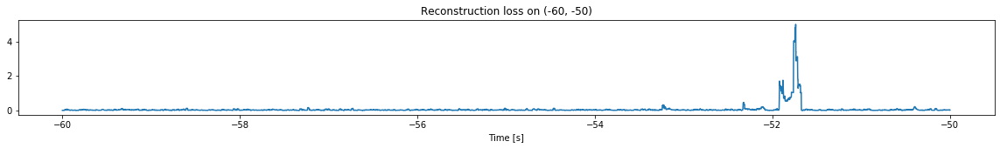

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


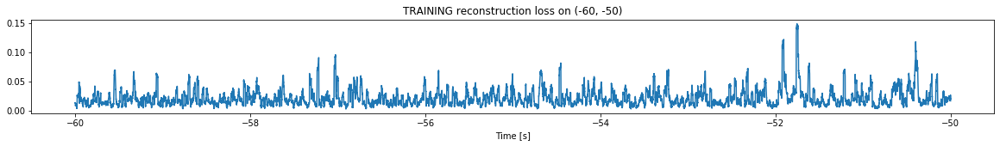

Finished training, median of the log(loss) is:  -1.7504221585440431
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8685675279709244


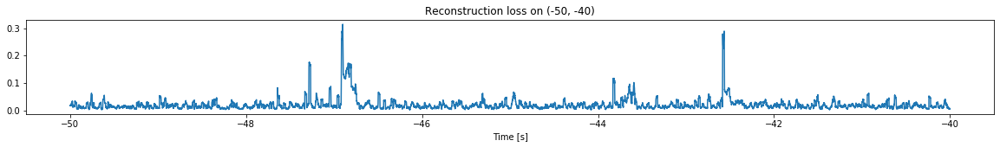

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


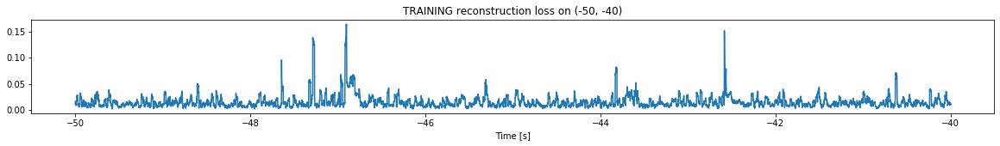

Finished training, median of the log(loss) is:  -1.9065768857371626
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7504221585440431


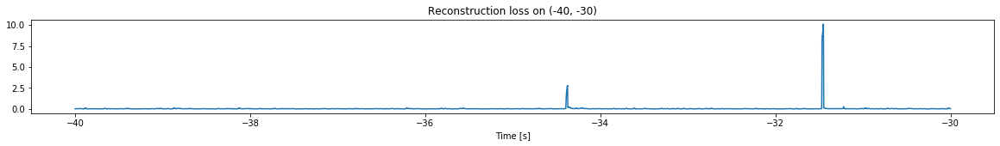

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


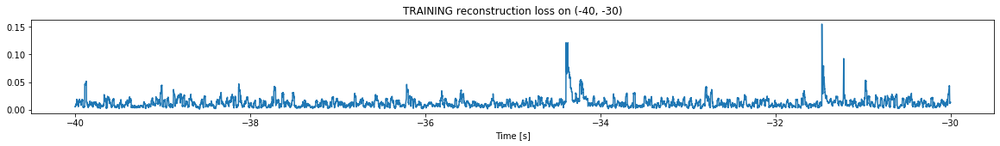

Finished training, median of the log(loss) is:  -2.001114303384473
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9065768857371626


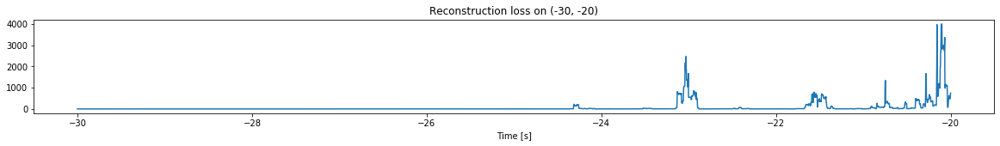

Other trigger time:  [-24.3116   -23.0304   -22.4212   -21.5602   -20.7482   -20.103699]
Their log loss values are:  [4.24394068 5.30008733 3.76312376 4.80097154 5.034799   5.50842712]


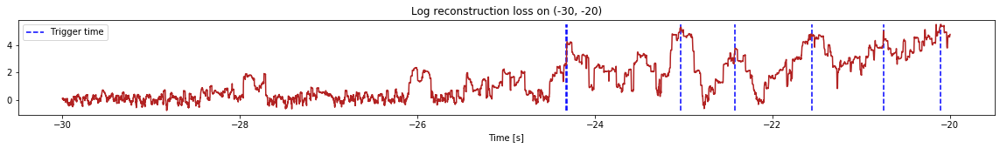

Triggered at:  [-24.3116, -23.0304, -22.4212, -21.5602, -20.7482, -20.103699]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


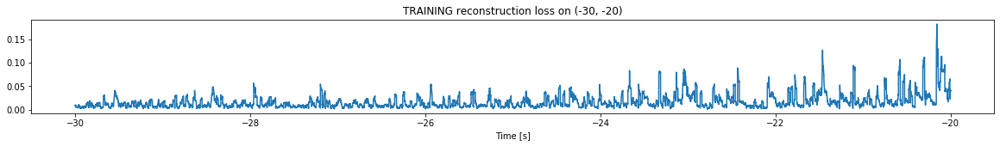

Finished training, median of the log(loss) is:  -1.912283151644547
Triggering for section:  (-20, -10)
Using this median for triggering: -2.001114303384473


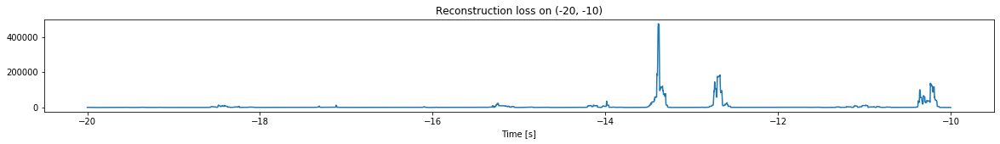

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


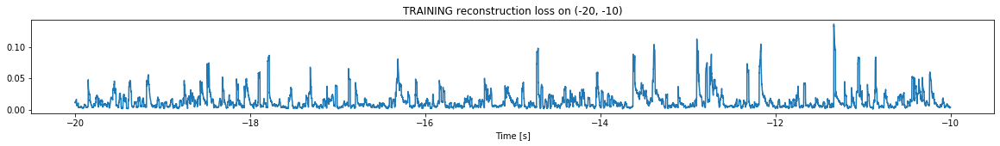

Finished training, median of the log(loss) is:  -2.0256672523152783
Triggering for section:  (-10, 0)
Using this median for triggering: -1.912283151644547


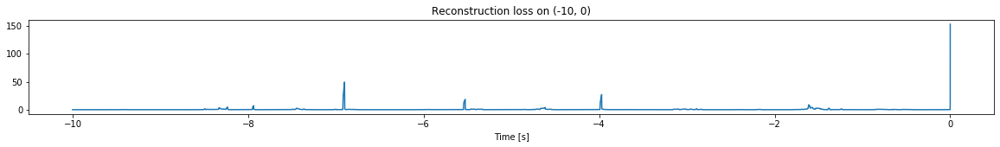

Other trigger time:  [-6.9013 -5.5269 -3.9722]
Their log loss values are:  [3.60676207 3.18056085 3.34483042]


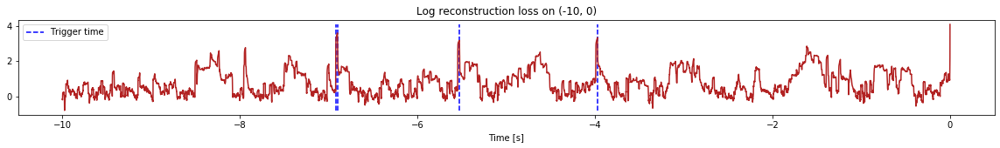

Triggered at:  [-6.9013, -5.5269, -3.9722]
<--------
Finished simulation, all the triggered times are:  [-24.3116, -23.0304, -22.4212, -21.5602, -20.7482, -20.103699, -6.9013, -5.5269, -3.9722]


In [20]:
simulation("./data/Ramp26/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (699800, 13)
Flushing input history
Number of sections: 7
Entering sections:  (-70, -60)
-------->
Entering sections:  (-60, -50)
-------->
Training for section:  (None, -60)


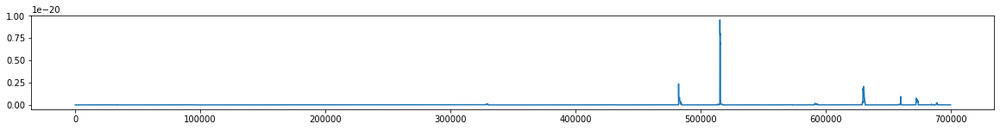

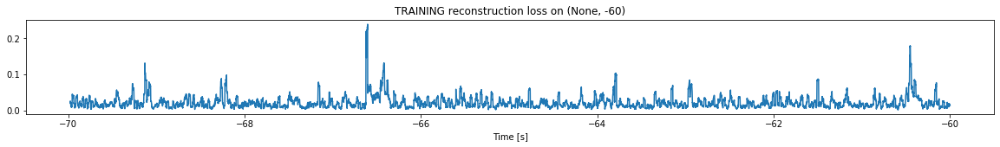

Finished training, median of the log(loss) is:  -1.7238773568198738
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


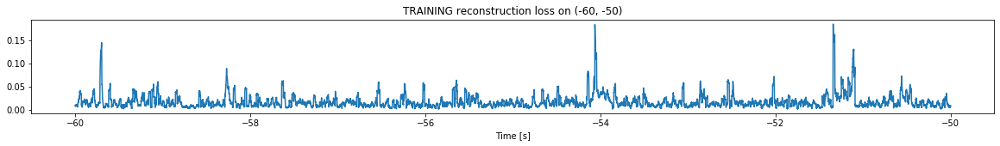

Finished training, median of the log(loss) is:  -1.8591175988228392
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7238773568198738


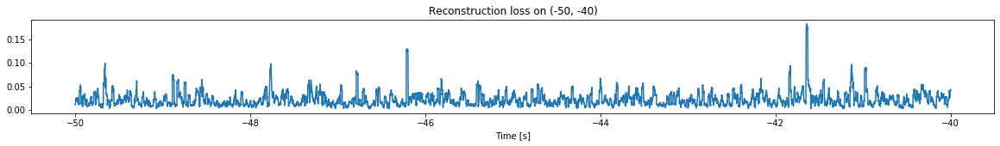

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


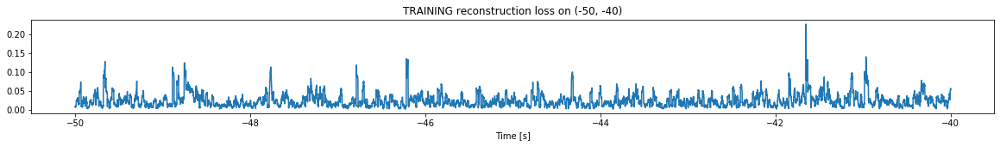

Finished training, median of the log(loss) is:  -1.6685882117917656
Triggering for section:  (-40, -30)
Using this median for triggering: -1.8591175988228392


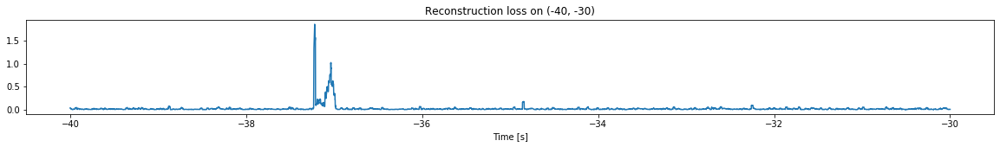

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


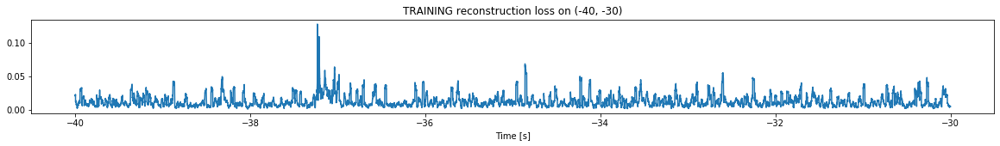

Finished training, median of the log(loss) is:  -1.9882475099077541
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6685882117917656


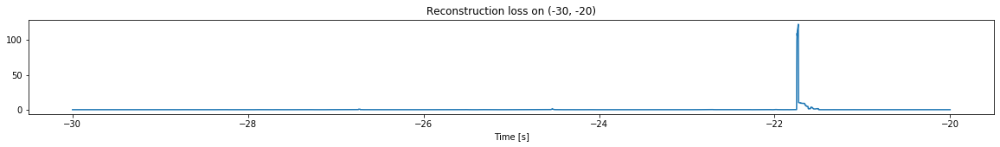

Other trigger time:  [-21.7299]
Their log loss values are:  [3.75661234]


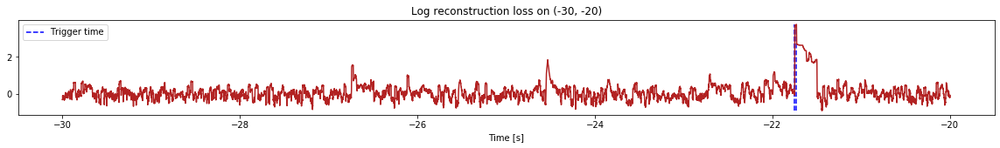

Triggered at:  [-21.7299]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


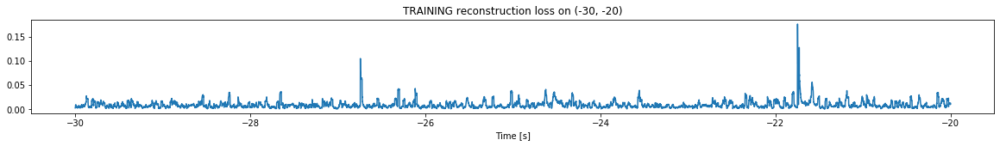

Finished training, median of the log(loss) is:  -2.1079454399188062
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9882475099077541


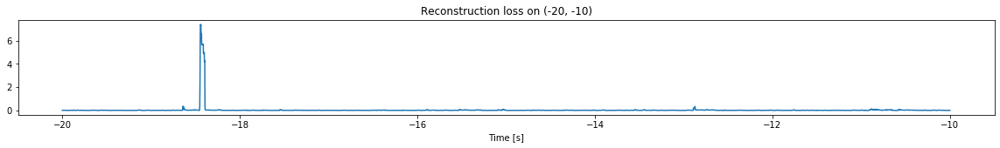

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


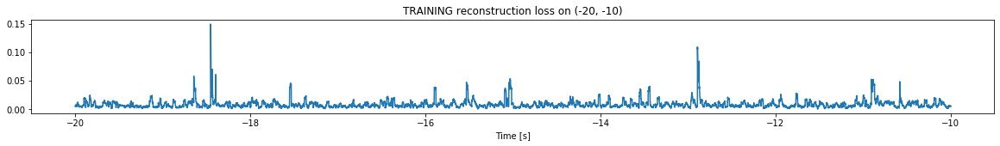

Finished training, median of the log(loss) is:  -2.1405247476942924
Triggering for section:  (-10, 0)
Using this median for triggering: -2.1079454399188062


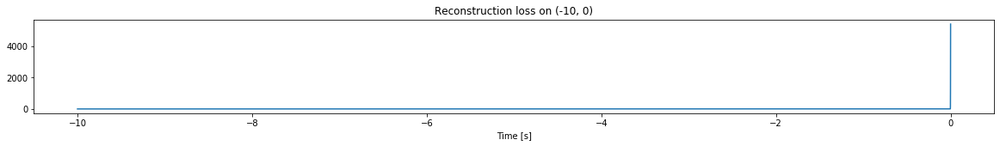

Other trigger time:  []
Their log loss values are:  []


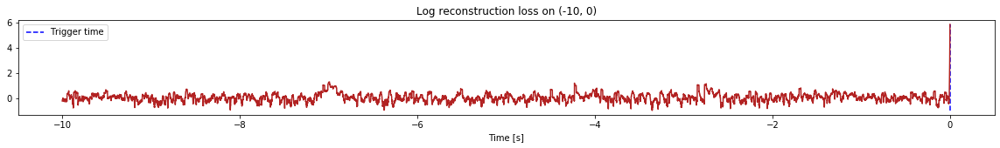

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  [-21.7299]


In [21]:
simulation("./data/Ramp27/", 10, (-70,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (599800, 13)
Flushing input history
Number of sections: 6
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


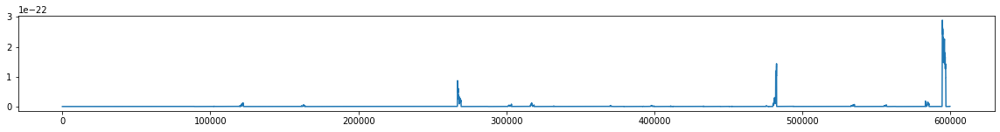

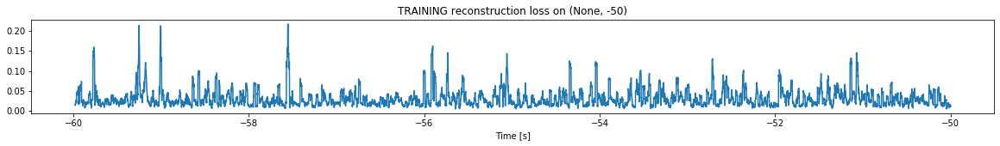

Finished training, median of the log(loss) is:  -1.5975060932082712
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


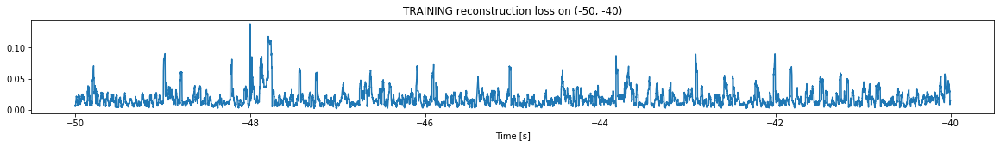

Finished training, median of the log(loss) is:  -1.8299875509243857
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5975060932082712


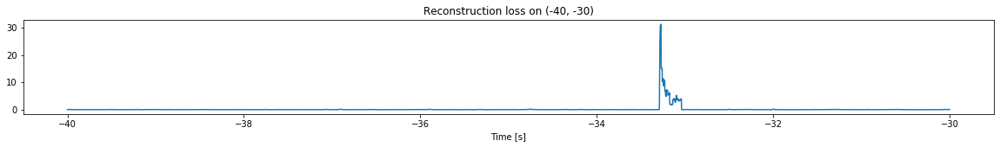

Other trigger time:  [-33.271698]
Their log loss values are:  [3.09211501]


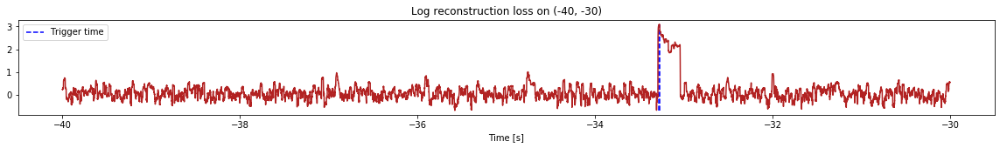

Triggered at:  [-33.271698]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


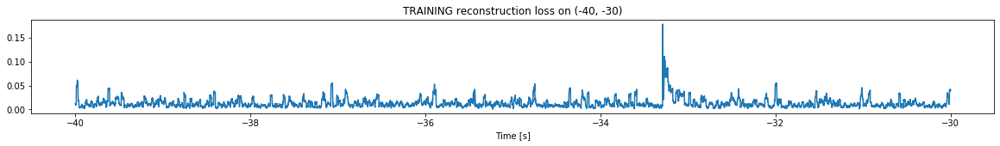

Finished training, median of the log(loss) is:  -1.9710306149034498
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8299875509243857


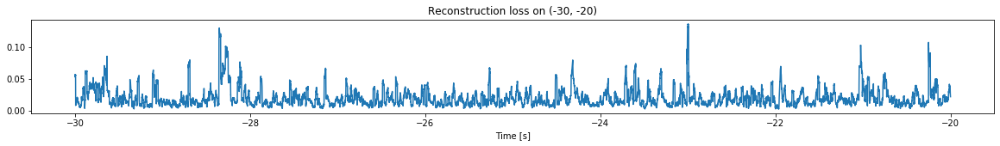

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


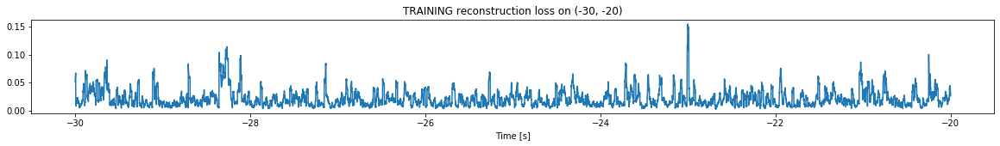

Finished training, median of the log(loss) is:  -1.7534806971349157
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9710306149034498


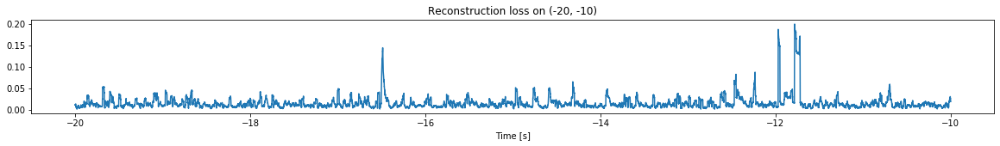

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


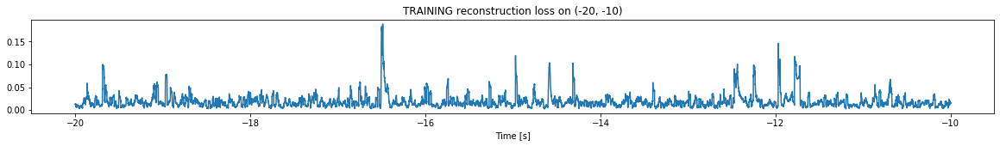

Finished training, median of the log(loss) is:  -1.8128193183259056
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7534806971349157


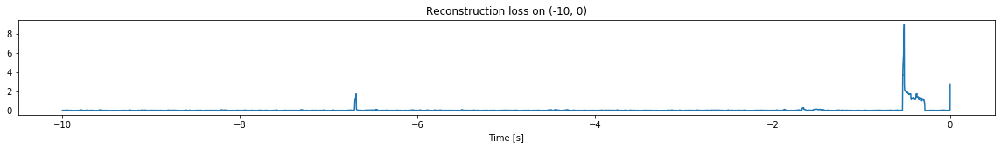

<--------
Finished simulation, all the triggered times are:  [-33.271698]


In [22]:
simulation("./data/Ramp28/", 10, (-60,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


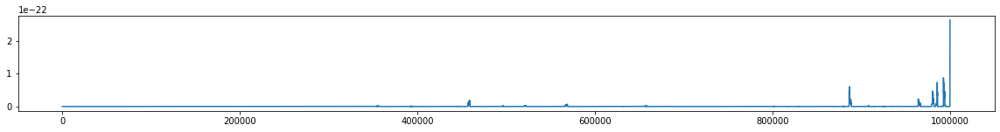

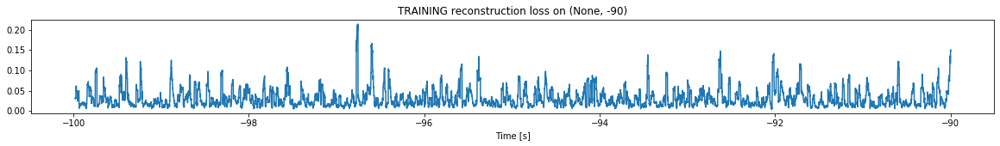

Finished training, median of the log(loss) is:  -1.6022792802398804
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


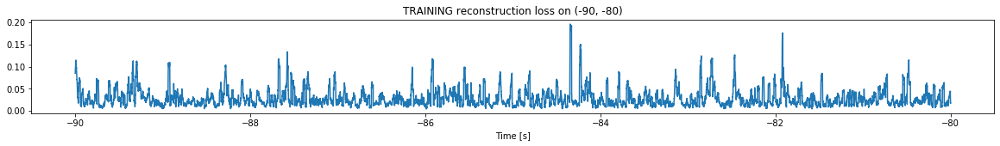

Finished training, median of the log(loss) is:  -1.6341045155997849
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6022792802398804


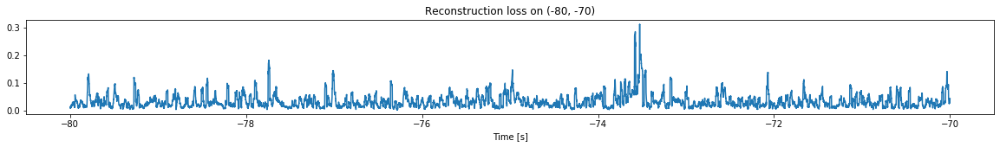

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


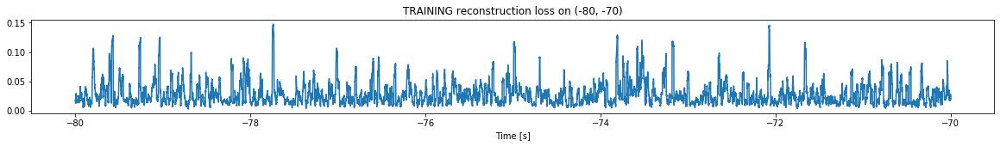

Finished training, median of the log(loss) is:  -1.633093153802061
Triggering for section:  (-70, -60)
Using this median for triggering: -1.6341045155997849


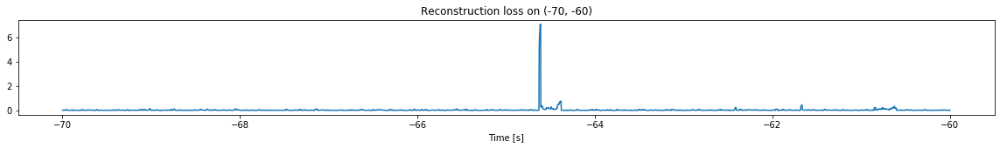

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


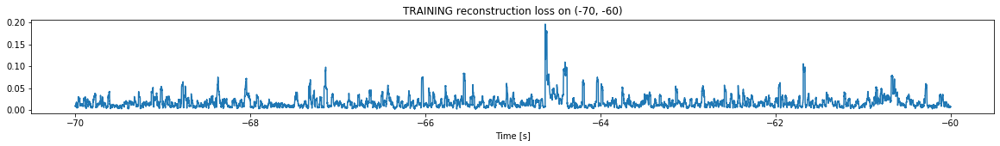

Finished training, median of the log(loss) is:  -1.8550433149921113
Triggering for section:  (-60, -50)
Using this median for triggering: -1.633093153802061


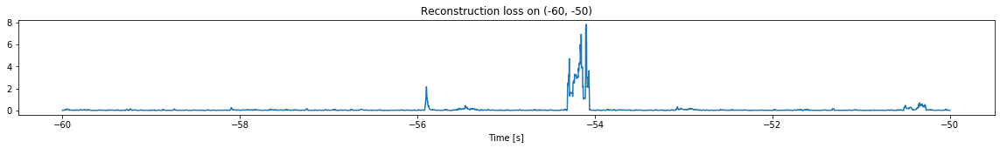

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


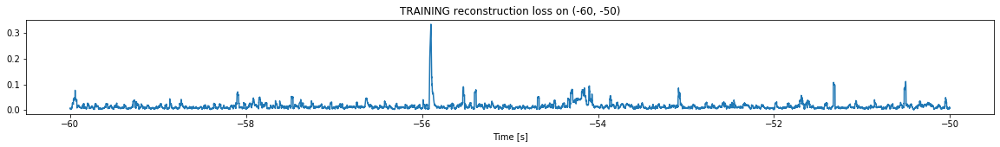

Finished training, median of the log(loss) is:  -1.9191873096860135
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8550433149921113


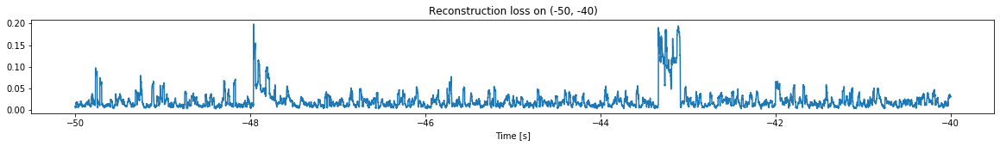

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


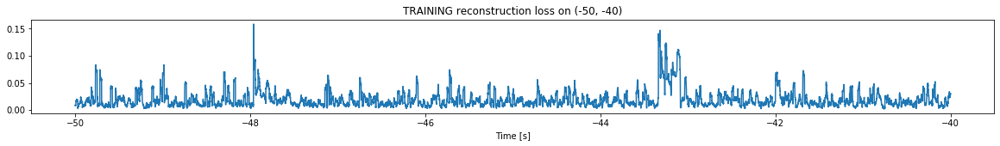

Finished training, median of the log(loss) is:  -1.8239629928775845
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9191873096860135


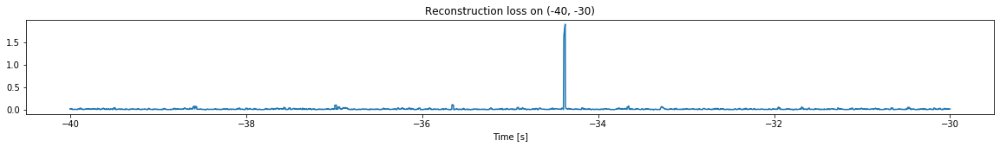

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


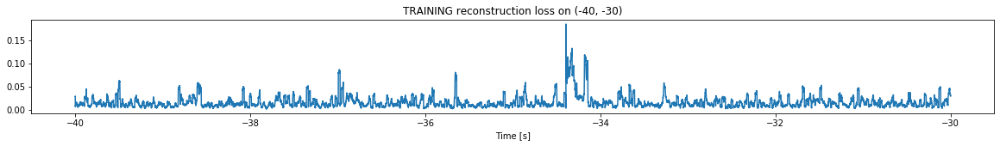

Finished training, median of the log(loss) is:  -1.8895272925438338
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8239629928775845


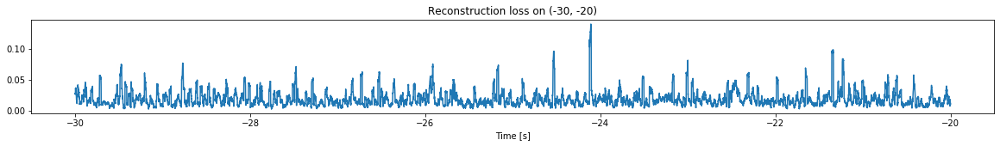

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


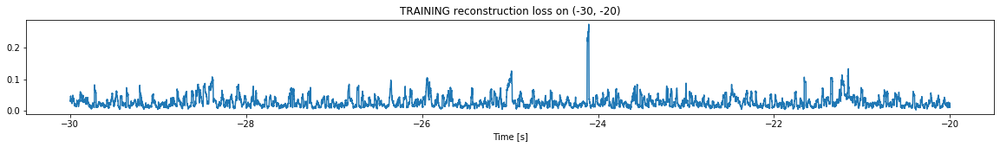

Finished training, median of the log(loss) is:  -1.6429173406075224
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8895272925438338


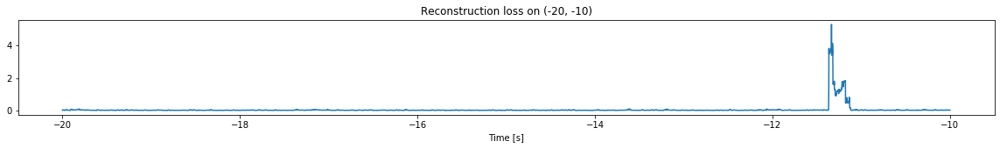

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


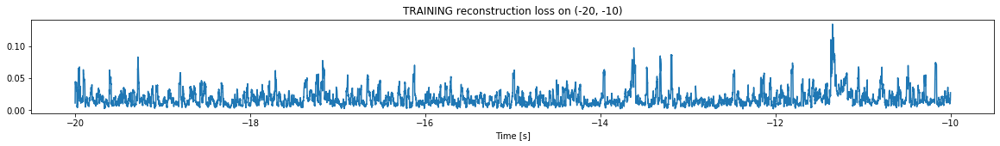

Finished training, median of the log(loss) is:  -1.817711293596655
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6429173406075224


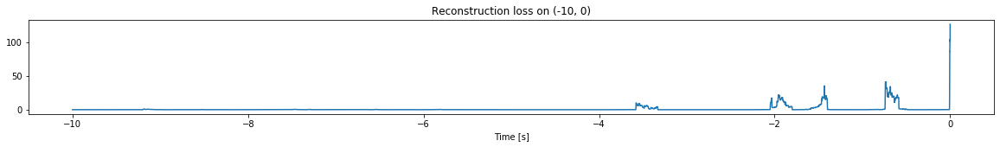

Other trigger time:  [-1.4339000e+00 -7.3390001e-01 -5.9999997e-04]
Their log loss values are:  [3.18927617 3.25571285 3.65917941]


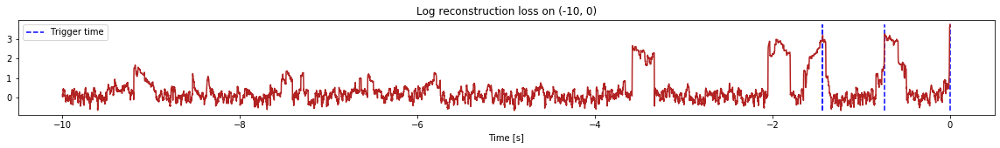

Triggered at:  [-1.4339, -0.7339, -0.00059999997]
<--------
Finished simulation, all the triggered times are:  [-1.4339, -0.7339, -0.00059999997]


In [9]:
simulation("./data/Ramp29/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1199800, 13)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


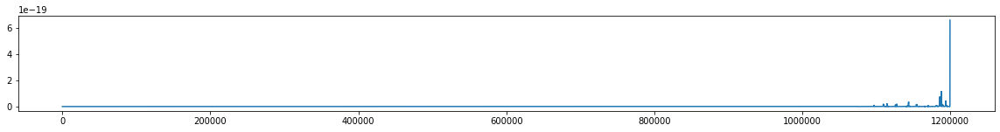

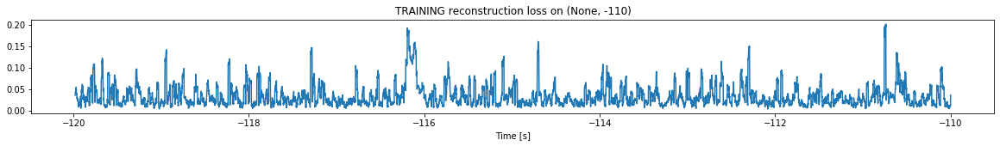

Finished training, median of the log(loss) is:  -1.5597927563278897
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


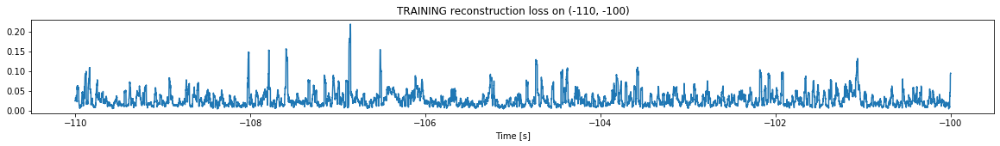

Finished training, median of the log(loss) is:  -1.6513884644089796
Triggering for section:  (-100, -90)
Using this median for triggering: -1.5597927563278897


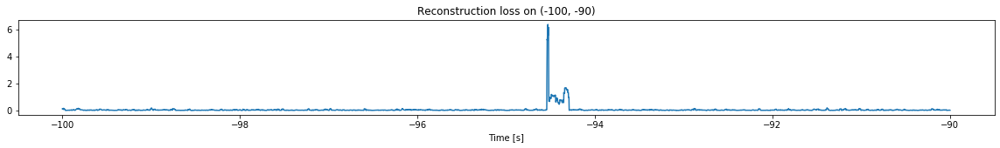

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


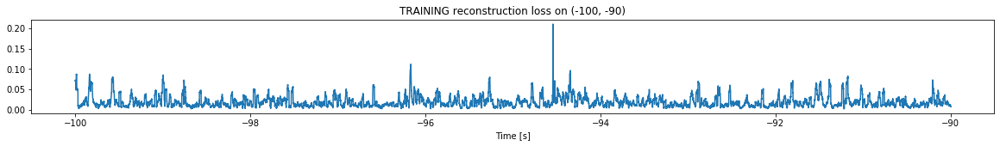

Finished training, median of the log(loss) is:  -1.7930340548258388
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6513884644089796


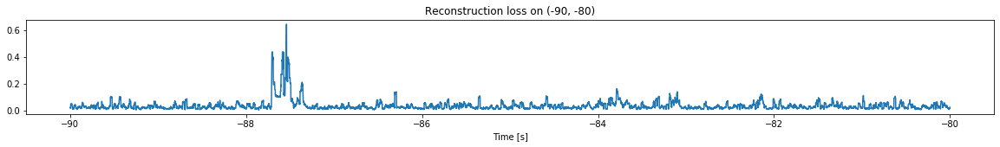

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


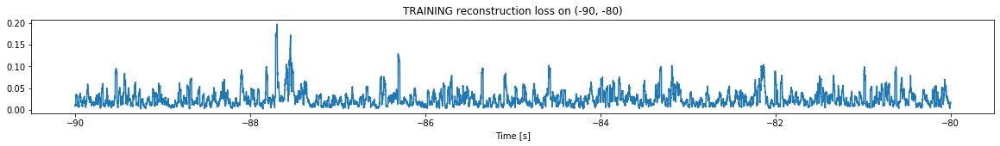

Finished training, median of the log(loss) is:  -1.661825943471269
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7930340548258388


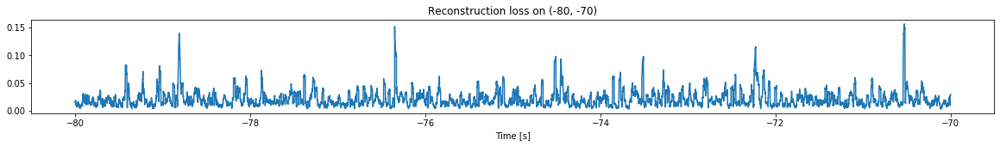

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


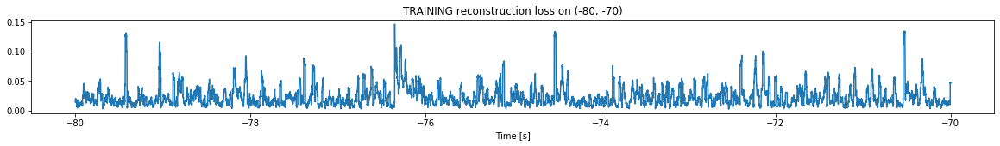

Finished training, median of the log(loss) is:  -1.718215269795055
Triggering for section:  (-70, -60)
Using this median for triggering: -1.661825943471269


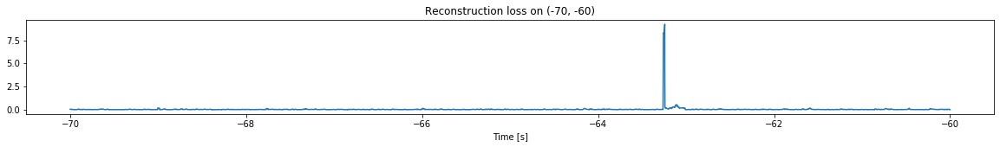

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


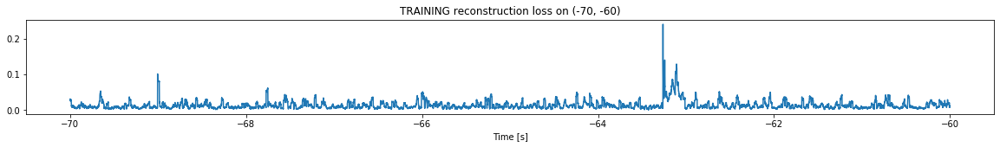

Finished training, median of the log(loss) is:  -1.9656710196555909
Triggering for section:  (-60, -50)
Using this median for triggering: -1.718215269795055


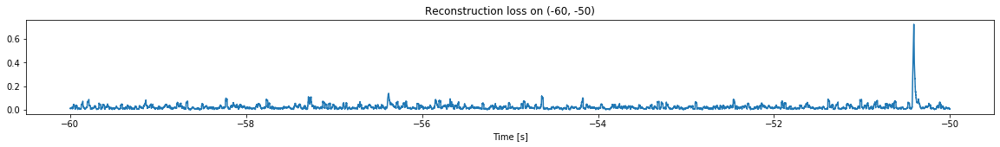

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


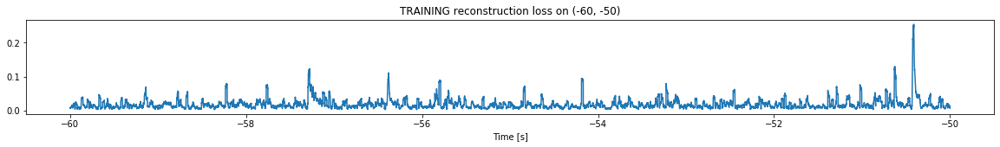

Finished training, median of the log(loss) is:  -1.813184985970698
Triggering for section:  (-50, -40)
Using this median for triggering: -1.9656710196555909


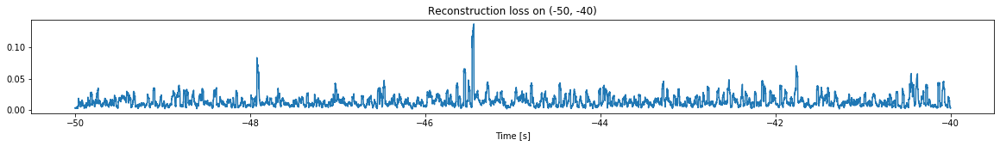

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


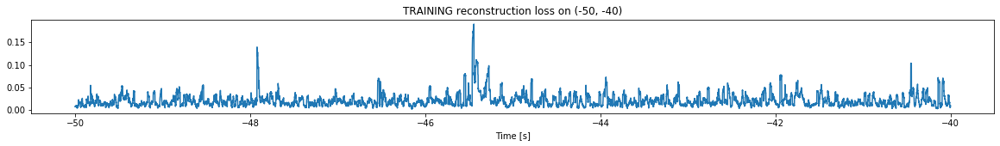

Finished training, median of the log(loss) is:  -1.7486519307580028
Triggering for section:  (-40, -30)
Using this median for triggering: -1.813184985970698


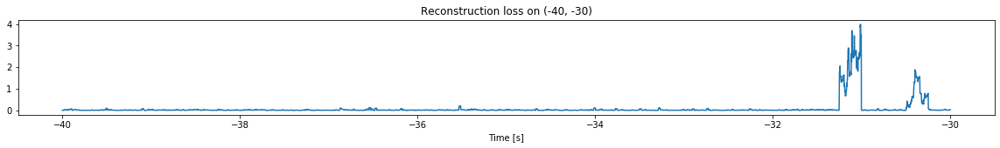

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


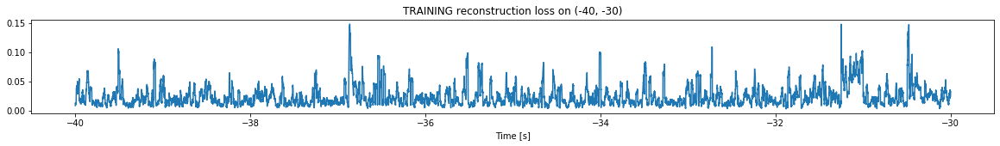

Finished training, median of the log(loss) is:  -1.7139305938754037
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7486519307580028


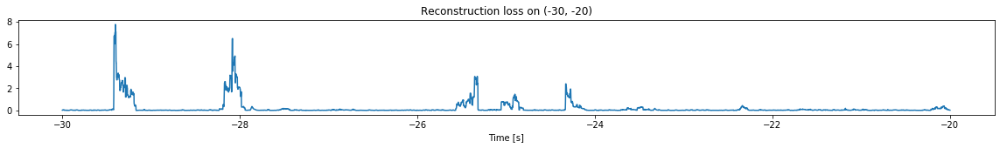

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


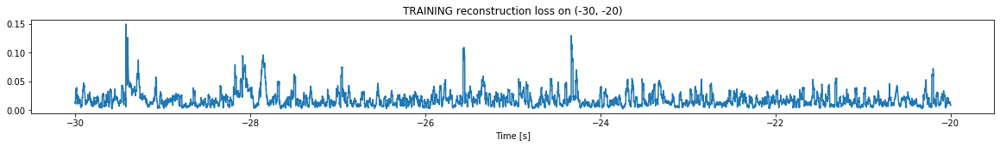

Finished training, median of the log(loss) is:  -1.7981361012127555
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7139305938754037


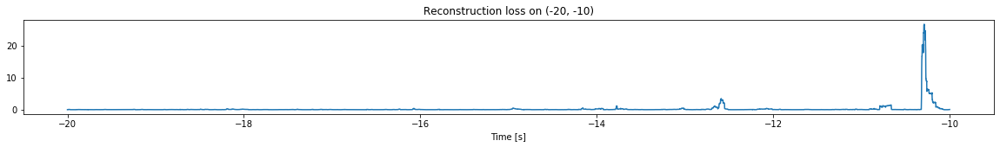

Other trigger time:  [-10.2893]
Their log loss values are:  [3.14288069]


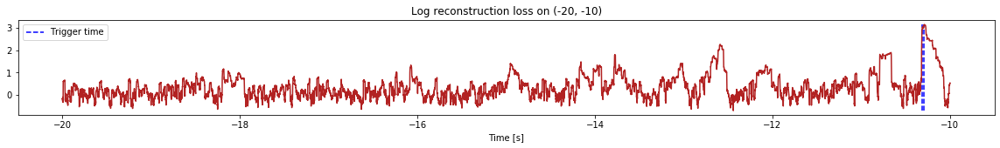

Triggered at:  [-10.2893]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


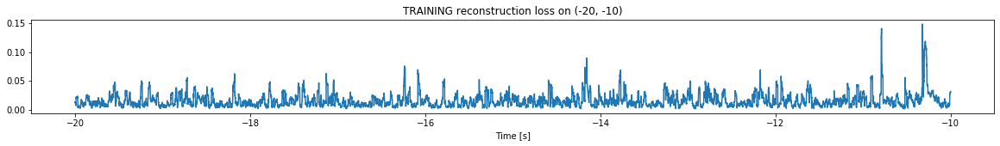

Finished training, median of the log(loss) is:  -1.8816405566257488
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7981361012127555


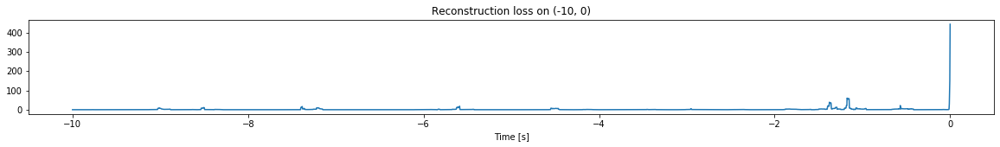

Other trigger time:  [-7.3824    -5.5889997 -1.1737    -0.5686   ]
Their log loss values are:  [3.00786678 3.06130912 3.57365631 3.14005961]


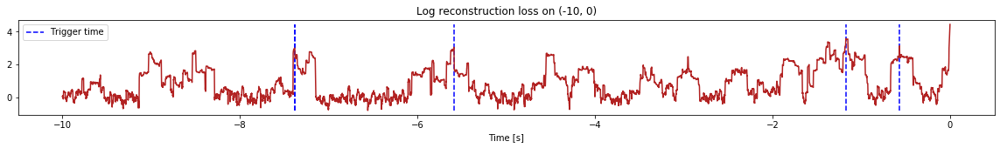

Triggered at:  [-7.3824, -5.5889997, -1.1737, -0.5686]
<--------
Finished simulation, all the triggered times are:  [-10.2893, -7.3824, -5.5889997, -1.1737, -0.5686]


In [23]:
simulation("./data/Ramp30/", 10, (-120,0))